In [1]:
import pandas as pd
import os
import shap
import numpy as np
from catboost import CatBoostClassifier, Pool, cv
import matplotlib.pyplot as plt
import seaborn as sns
import iso3166
import xgboost as xgb
import lightgbm as lgb
import hyperopt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.compose import make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import StratifiedKFold
from catboost.utils import get_roc_curve
from sklearn.metrics import plot_confusion_matrix, recall_score
from sklearn.metrics import log_loss, roc_curve, f1_score, precision_score
from sklearn.metrics import accuracy_score, auc, roc_auc_score, classification_report
from numpy.random import RandomState
import plotly.io as pio
pio.renderers.default = 'svg'  # for showing on github plotly image

In [2]:
# Graphs
def num_col_analyse(col):
    print(col)
    print('Percentage of missing values: ',
          round((df[col].isna().sum()/len(df))*100))
    print('Count of missing values: ',
          (df[col].isna().sum()))
    fig = px.histogram(df, x=col, color='fraud')
    fig.show()
    print(df[col].describe())


# country to iso
def country_fix(x):
    try:
        return iso3166.countries.get(x)[1]
    except:
        return x


# clean operator name
def clean(response):
    if response.rstrip() != 'nan':
        if Operator[i] in response.rstrip():
            return Operator[i]
        else:
            return response
    else:
        return response


# count unique in features
def agg_func_nuniq(by, col):
    rep = df.groupby(by)[col].nunique().to_dict()
    df['ncount_'+col] = df[by].replace(rep)


# aggregates
def agg_func(by, col, agg):
    rep = df.groupby(by)[col].agg(agg).to_dict()
    df[agg+'_'+col] = df[by].replace(rep)
    

# infrequent values in others
def nn_count(table_train,
             quartile=90):  # trim the Quantel
    categorical_columns = [c for c in table_train.columns if table_train[c].
                           dtype.name == 'object']
    print(categorical_columns)
    for attrib in categorical_columns:
        col_with_freqs = list(table_train[attrib].value_counts())
        top_attrib_count = int(np.percentile(col_with_freqs, quartile))
        all_attrib = table_train[attrib].value_counts().index
        top_attrib = table_train[attrib].\
            value_counts()[table_train[attrib].
                           value_counts() > top_attrib_count].index
        attrib_to_throw_away = list(set(all_attrib) - set(top_attrib))
        table_train.loc[table_train[attrib].
                        isin(attrib_to_throw_away), attrib] = 'other'
        

# show outliers
def outliers_iqr(ys):
    quartile_1, quartile_3 = np.percentile(ys, [25, 75])
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    print('Lower bound:', lower_bound, 'Upper bound:', upper_bound)
    print(len(np.where((ys > upper_bound) | (ys < lower_bound))[0]))
    

# remove collinear features
def remove_collinear_features(x, threshold):
    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []
    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            val = abs(item.values)
            # If correlation exceeds the threshold
            if val >= threshold:
                drop_cols.append(col.values[0])
    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    print(f'Drop {drops}')
    x = x.drop(columns=drops)  # Prepare data for modelling
    return x


# plot confusion matrix
def confusion_matrix_plot(clfs):
    plt.style.use('default')
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
    for cls, ax in zip(clfs, axes.flatten()):
        plot_confusion_matrix(cls,
                              X_test,
                              y_test,
                              ax=ax,
                              cmap='Reds',
                              display_labels=df.fraud.
                              value_counts().index.to_list())
        ax.title.set_text(cls.steps[-1][0])
    plt.tight_layout()
    plt.show()
    

# compare table
def get_scores(clfs):
    metrics = pd.DataFrame([], columns=['Name', 'Accuracy', 'AUC Score',
                                        'Precision', 'Recall', 'F1-Score',
                                        'Logloss'])
    for cls in clfs:
        stats = {}
        prediction = cls.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test, prediction, pos_label=1)
        stats.update({'Accuracy': accuracy_score(y_test, prediction),
                      'Name': cls.steps[-1][0],
                      'Recall': recall_score(y_test, prediction),
                      'F1-Score': f1_score(y_test, prediction),
                      'AUC Score': roc_auc_score(y_test, prediction),
                      'Logloss': log_loss(y_test, prediction),
                      'Precision': precision_score(y_test, prediction)})
        metrics = metrics.append(stats, ignore_index=True)
    return metrics

In [3]:
seed = 8

In [4]:
df = pd.read_csv("data.csv", sep=';', parse_dates=['created_at'], index_col=0) 

In [5]:
df.shape

(56428, 36)

In [6]:
df.head()

,fraud,age,day_from_create,emailage_score,risk_score,source_type,identification_id,domain,locality,os,...,ip_score,bank_url_reffer,complete_verification,decline_verification,review_answer,phone_type,phone_status,phone_additional_status,card_count,ip_cnt
0,0,35.0,0,NaN,NaN,1,201693,gmail.com,en-US,Windows10,...,NaN,secure2.arcot.com,0,0,NaN,0.0,0.0,0.0,1,1
1,0,NaN,28,NaN,NaN,0,199466,android,NaN,NaN,...,;0.00,authentication.cardinalcommerce.com,50,30,0.0,0.0,3.0,0.0,2,2
2,0,NaN,28,NaN,NaN,0,199466,android,NaN,NaN,...,NaN,authentication.cardinalcommerce.com,51,29,0.0,0.0,3.0,0.0,2,2
3,0,NaN,28,NaN,NaN,0,199466,android,NaN,NaN,...,;0.00,authentication.cardinalcommerce.com,50,30,0.0,0.0,3.0,0.0,2,2
4,0,23.0,43,500.0,0.11,1,198129,gmail.com,en-GB,Windows10,...,;0.00,3dsecureprd.fnb.co.za,3,0,1.0,2.0,3.0,0.0,1,1


In [7]:
df.sort_values(by='created_at', inplace=True)

# EDA

### Data description:
 -  fraud - *target, fraud flag*      
 -  age - *person age*    
 -  day_from_create - *days from registration* 
 -  emailage_score - *partner score by domain*
 -  risk_score - *partner score*      
 -  source_type - *source type*       
 -  identification_id - *person id*
 -  domain - *email or type of app*
 -  locality - *keyboard locality*     
 -  os - *computer OS*        
 -  screen - *size of screen*    
 -  timezone - *browser timezone* 
 -  count_by_card - *count card match in base*        
 -  phone_verif_count - *count of verification telephone number*
 -  phone_count - *count telephone number match in base*  
 -  phone_count_not_verif - *count of not verification telephone number*
 -  currency_id - *currency*
 -  amount - *amount*      
 -  created_at - *date of request*
 -  count - *count of request*
 -  num_in_day_compl - *count of day request*
 -  status_outer - *outer status*    
 -  ip_country - *country by ip*      
 -  country - *country by card*   
 -  phone_country - *country by phone operator*   
 -  phone_operator - *phone operator*       
 -  ip_score - *partner score by ip*   
 -  bank_url_reffer - *bank url*      
 -  complete_verification - *complete verification*      
 -  decline_verification - *decline verification* 
 -  review_answer - *review answer type*    
 -  phone_type - *phone type*      
 -  phone_status - *phone status*     
 -  phone_additional_status - *phone additional status*      
 -  card_count - *card count*      
 -  ip_cnt - *ip count match in base*   

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56428 entries, 56427 to 0
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   fraud                    56428 non-null  int64         
 1   age                      30342 non-null  float64       
 2   day_from_create          56428 non-null  int64         
 3   emailage_score           10400 non-null  float64       
 4   risk_score               21712 non-null  float64       
 5   source_type              56428 non-null  int64         
 6   identification_id        56428 non-null  int64         
 7   domain                   56427 non-null  object        
 8   locality                 39846 non-null  object        
 9   os                       39815 non-null  object        
 10  screen                   39853 non-null  object        
 11  timezone                 39853 non-null  float64       
 12  count_by_card            56428 n

Look at missing values:

In [9]:
nan = pd.DataFrame(data={'count': df.isna().sum(),
                   'mean': df.isna().mean()}).sort_values(by='count',
                                                          ascending=False)
nan

,count,mean
emailage_score,46028,0.815694
phone_count_not_verif,37084,0.657191
risk_score,34716,0.615226
age,26086,0.462288
ip_score,21570,0.382257
phone_operator,19777,0.350482
phone_verif_count,16712,0.296165
os,16613,0.294411
locality,16582,0.293861
screen,16575,0.293737


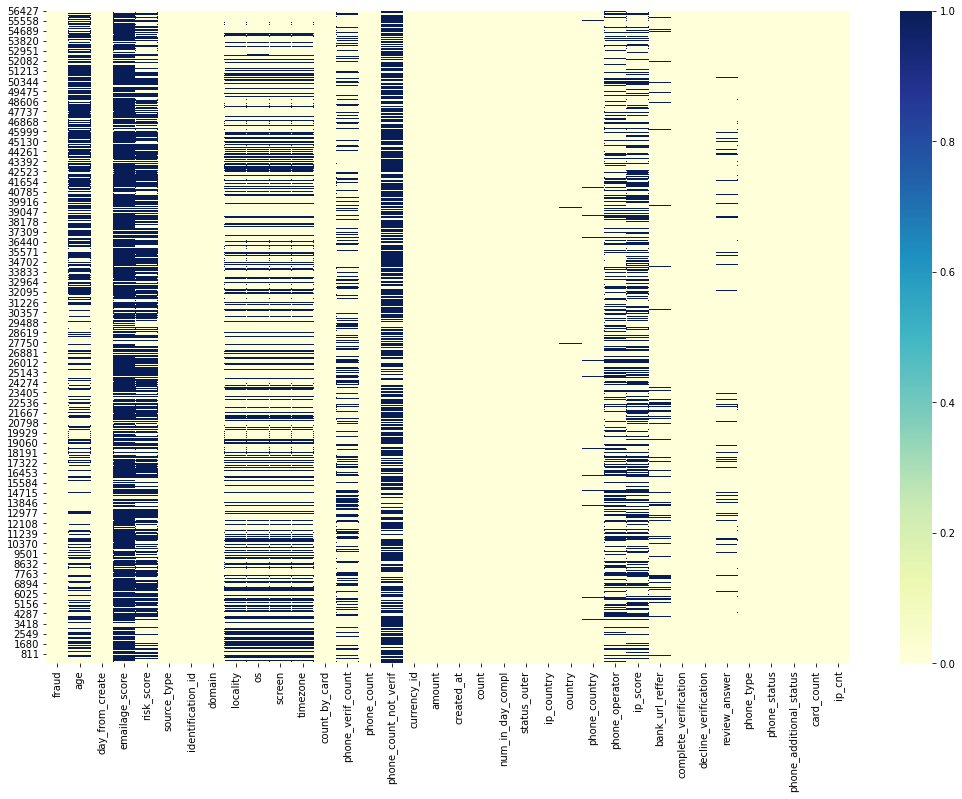

In [10]:
plt.figure(figsize=(18, 12))
sns.heatmap(df.isna(),  cmap="YlGnBu");

There are many nans in emailage_score 82%, phone_count_not_verif 66%, risk_score 62%.

In [11]:
df.describe()

,fraud,age,day_from_create,emailage_score,risk_score,source_type,identification_id,timezone,count_by_card,phone_verif_count,...,num_in_day_compl,status_outer,complete_verification,decline_verification,review_answer,phone_type,phone_status,phone_additional_status,card_count,ip_cnt
count,56428.000000,30342.000000,56428.000000,10400.000000,21712.000000,56428.000000,56428.000000,39853.000000,56428.000000,39716.000000,...,56428.000000,56428.000000,56428.000000,56428.000000,52361.000000,56424.000000,56424.000000,56424.000000,56428.000000,56428.000000
mean,0.032909,38.285808,49.810094,349.410385,6.575242,0.764585,185334.555593,-99.253381,1.322287,1.034142,...,1.498121,0.171617,11.562239,5.348373,-0.197991,1.361743,2.110538,0.252251,1.889470,1.161232
std,0.178401,13.418313,134.275794,267.617051,19.239925,0.424262,16458.971641,243.028365,1.508754,0.234917,...,1.222662,0.989516,33.790910,17.822242,0.872096,0.935162,1.371844,1.096748,2.101689,0.833096
min,0.000000,-294.000000,0.000000,18.000000,0.100000,0.000000,602.000000,-840.000000,1.000000,1.000000,...,1.000000,-3.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-3.000000,1.000000,1.000000
25%,0.000000,29.000000,0.000000,94.000000,0.100000,1.000000,180911.750000,-180.000000,1.000000,1.000000,...,1.000000,-1.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,1.000000,1.000000
50%,0.000000,36.000000,0.000000,242.000000,0.220000,1.000000,187505.500000,-120.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,3.000000,0.000000,1.000000,1.000000
75%,0.000000,46.000000,25.000000,500.000000,1.250000,1.000000,193997.000000,-60.000000,1.000000,1.000000,...,2.000000,1.000000,6.000000,3.000000,1.000000,2.000000,3.000000,0.000000,2.000000,1.000000
max,1.000000,119.000000,1675.000000,975.000000,99.000000,1.000000,201693.000000,720.000000,46.000000,3.000000,...,22.000000,3.000000,300.000000,190.000000,1.000000,3.000000,3.000000,5.000000,38.000000,33.000000


There are strange data in some columns.

Look at data carfully:

In [12]:
print(f'Fraud procent in data {round(df.fraud.mean()*100, 1)}%')

Fraud procent in data 3.3%


We have unbalanced data.

Plot data distribution.

fraud
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

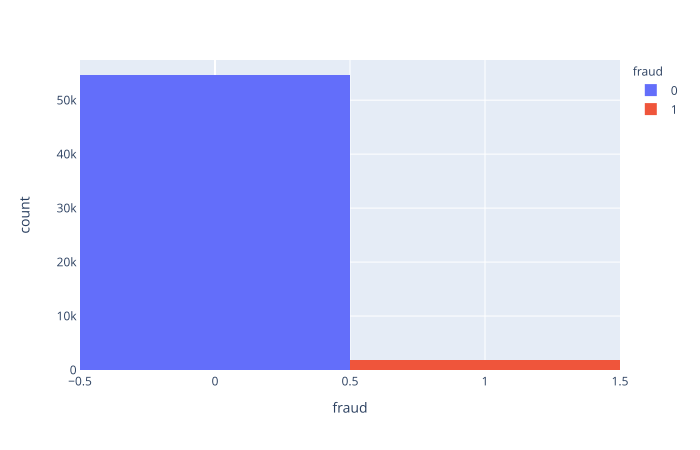

count    56428.000000
mean         0.032909
std          0.178401
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: fraud, dtype: float64
age
Percentage of missing values:  46.0
Count of missing values:  26086


<IPython.core.display.Javascript object>

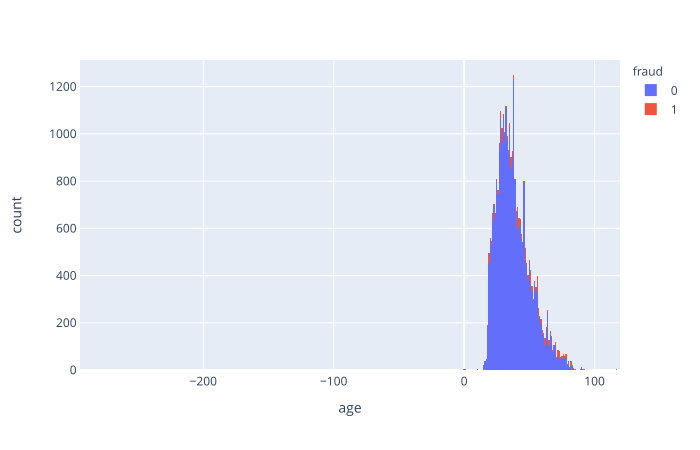

count    30342.000000
mean        38.285808
std         13.418313
min       -294.000000
25%         29.000000
50%         36.000000
75%         46.000000
max        119.000000
Name: age, dtype: float64
day_from_create
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

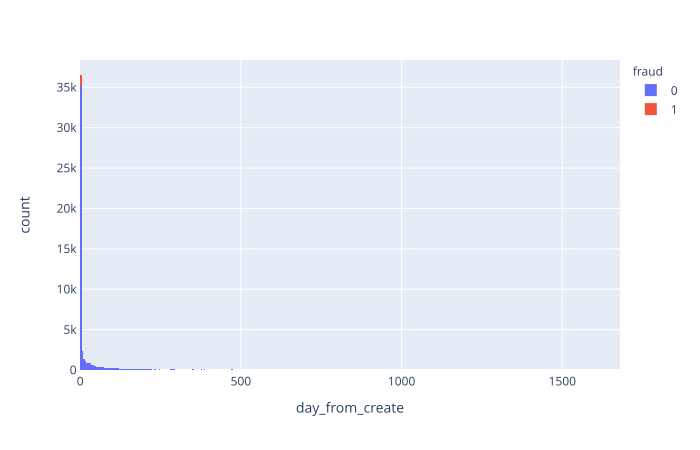

count    56428.000000
mean        49.810094
std        134.275794
min          0.000000
25%          0.000000
50%          0.000000
75%         25.000000
max       1675.000000
Name: day_from_create, dtype: float64
emailage_score
Percentage of missing values:  82.0
Count of missing values:  46028


<IPython.core.display.Javascript object>

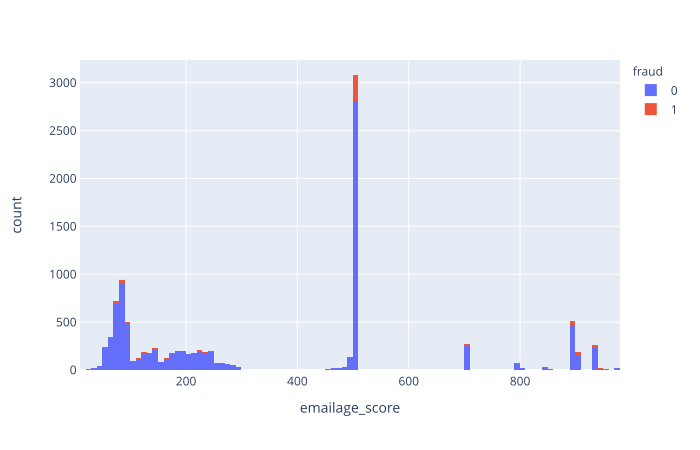

count    10400.000000
mean       349.410385
std        267.617051
min         18.000000
25%         94.000000
50%        242.000000
75%        500.000000
max        975.000000
Name: emailage_score, dtype: float64
risk_score
Percentage of missing values:  62.0
Count of missing values:  34716


<IPython.core.display.Javascript object>

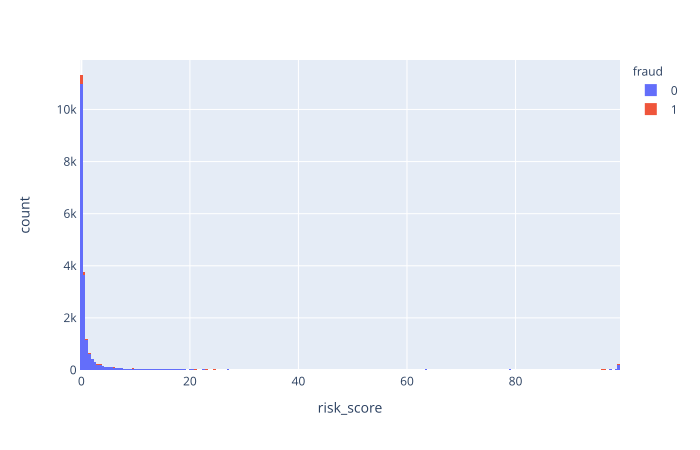

count    21712.000000
mean         6.575242
std         19.239925
min          0.100000
25%          0.100000
50%          0.220000
75%          1.250000
max         99.000000
Name: risk_score, dtype: float64
source_type
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

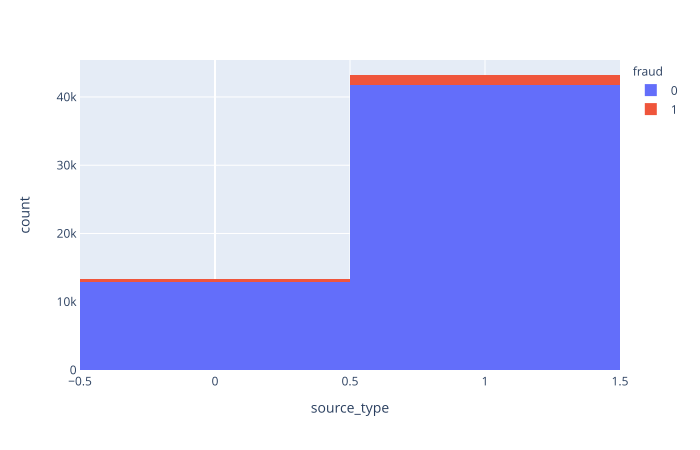

count    56428.000000
mean         0.764585
std          0.424262
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: source_type, dtype: float64
identification_id
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

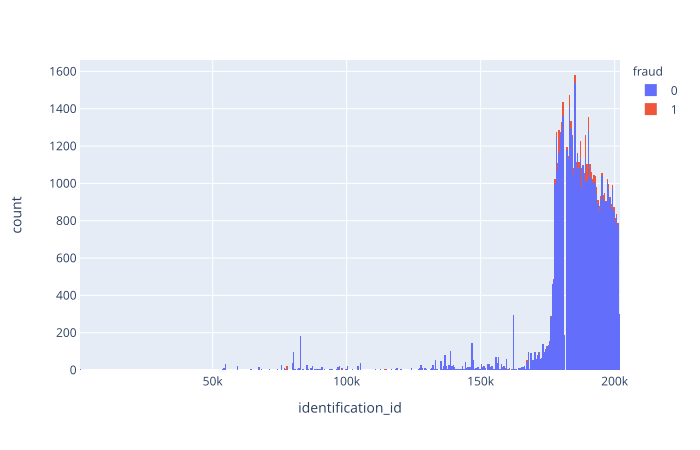

count     56428.000000
mean     185334.555593
std       16458.971641
min         602.000000
25%      180911.750000
50%      187505.500000
75%      193997.000000
max      201693.000000
Name: identification_id, dtype: float64
timezone
Percentage of missing values:  29.0
Count of missing values:  16575


<IPython.core.display.Javascript object>

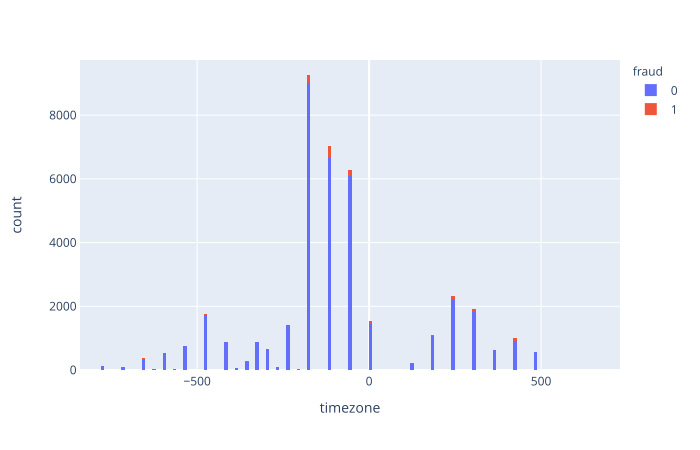

count    39853.000000
mean       -99.253381
std        243.028365
min       -840.000000
25%       -180.000000
50%       -120.000000
75%        -60.000000
max        720.000000
Name: timezone, dtype: float64
count_by_card
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

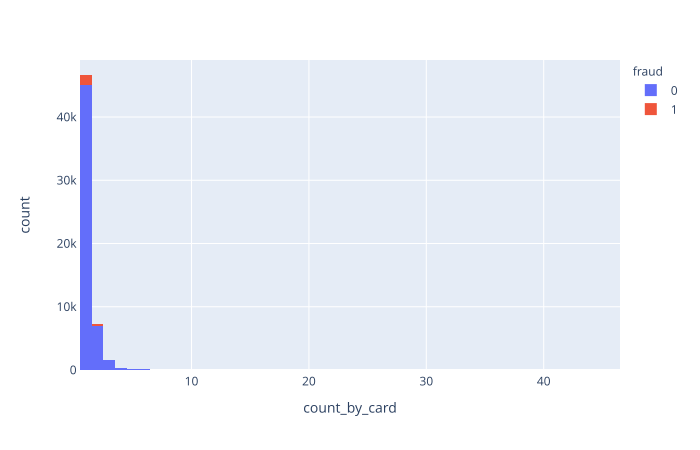

count    56428.000000
mean         1.322287
std          1.508754
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         46.000000
Name: count_by_card, dtype: float64
phone_verif_count
Percentage of missing values:  30.0
Count of missing values:  16712


<IPython.core.display.Javascript object>

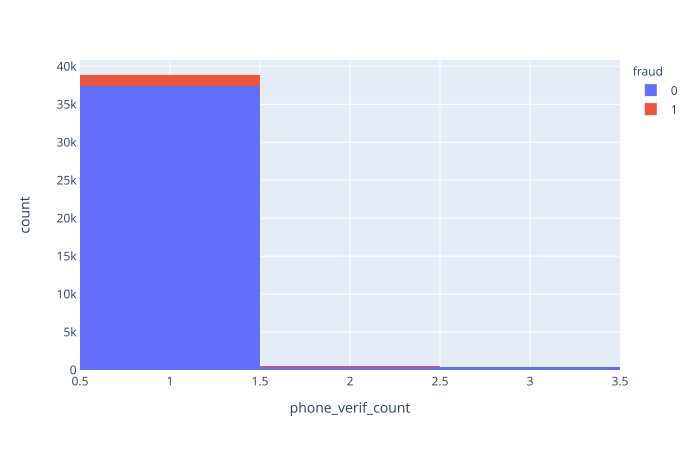

count    39716.000000
mean         1.034142
std          0.234917
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          3.000000
Name: phone_verif_count, dtype: float64
phone_count
Percentage of missing values:  0.0
Count of missing values:  4


<IPython.core.display.Javascript object>

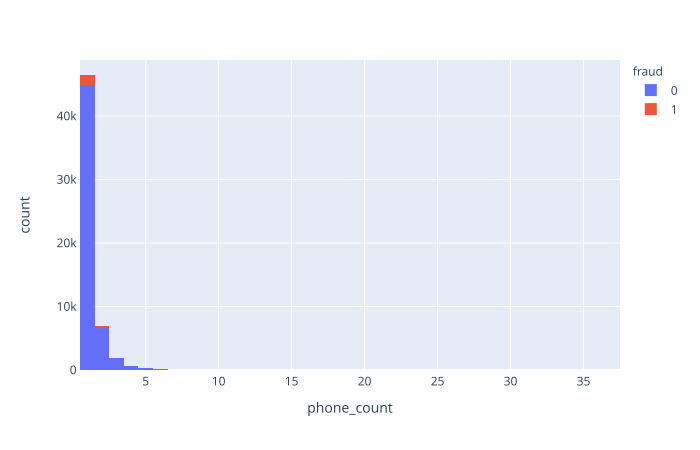

count    56424.000000
mean         1.301219
std          1.046941
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         37.000000
Name: phone_count, dtype: float64
phone_count_not_verif
Percentage of missing values:  66.0
Count of missing values:  37084


<IPython.core.display.Javascript object>

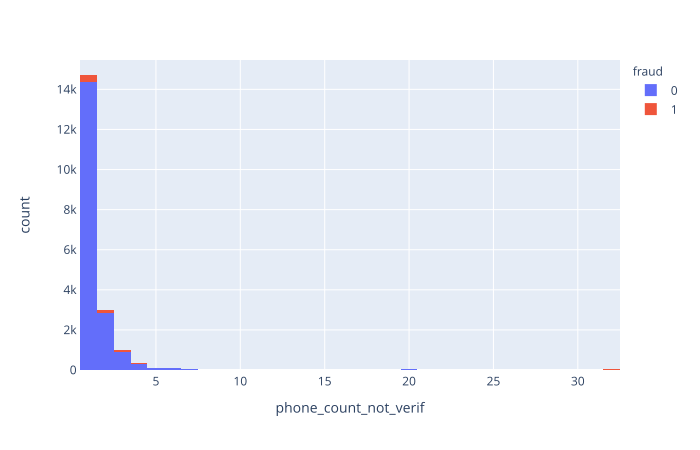

count    19344.000000
mean         1.500620
std          2.015244
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         32.000000
Name: phone_count_not_verif, dtype: float64
currency_id
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

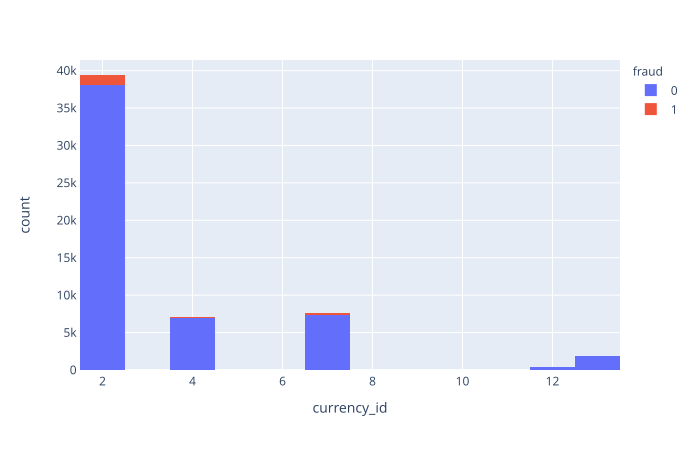

count    56428.000000
mean         3.378713
std          2.619315
min          2.000000
25%          2.000000
50%          2.000000
75%          4.000000
max         13.000000
Name: currency_id, dtype: float64
amount
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

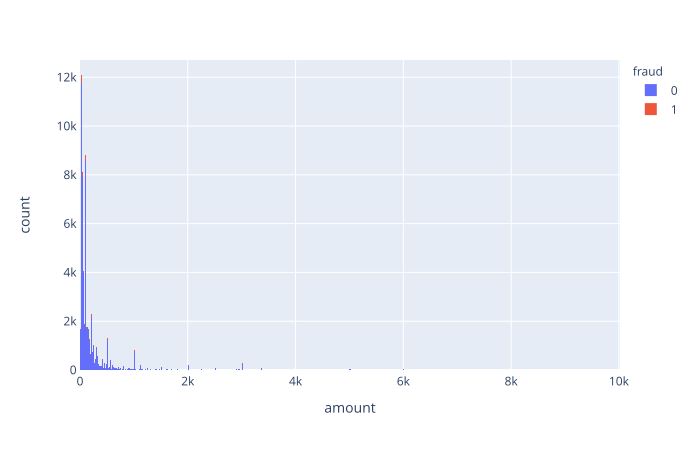

count    56428.000000
mean       236.612736
std        530.963613
min          1.000000
25%         40.000000
50%        100.000000
75%        200.000000
max      10000.000000
Name: amount, dtype: float64
created_at
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

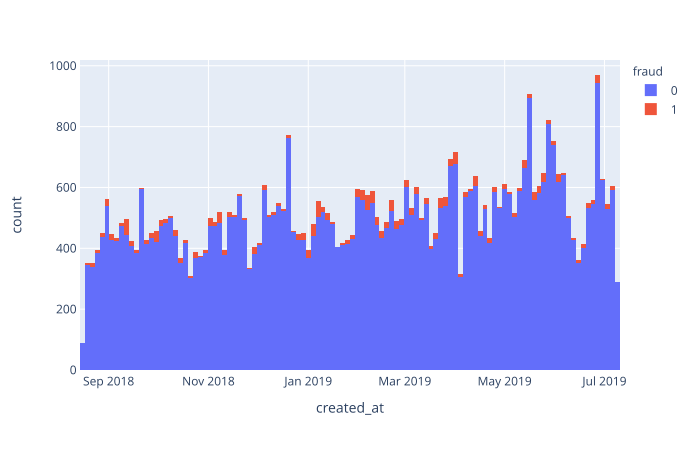

count                          56428
unique                         56423
top       2019-06-06 22:50:42.670000
freq                               2
first     2018-08-16 17:03:49.973000
last      2019-07-08 23:56:16.117000
Name: created_at, dtype: object
count
Percentage of missing values:  0.0
Count of missing values:  0


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.



<IPython.core.display.Javascript object>

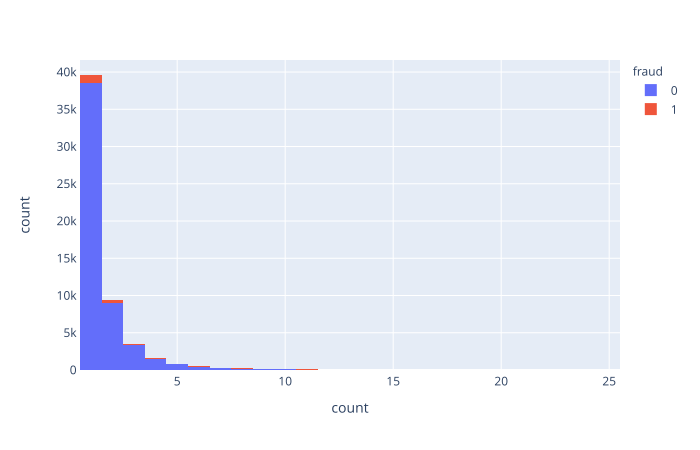

count    56428.000000
mean         1.628854
std          1.456721
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: count, dtype: float64
num_in_day_compl
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

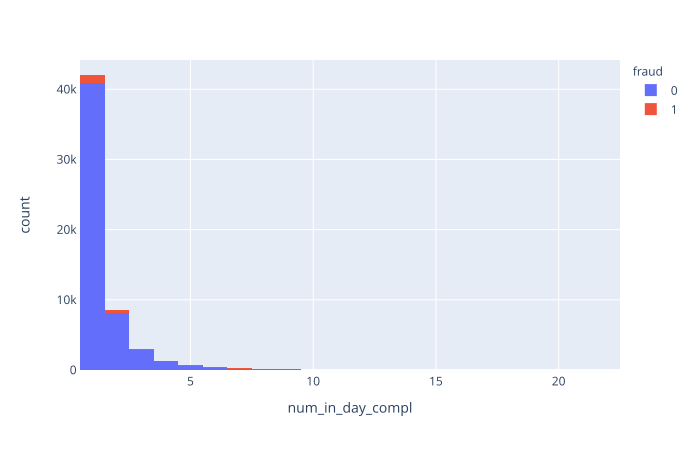

count    56428.000000
mean         1.498121
std          1.222662
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         22.000000
Name: num_in_day_compl, dtype: float64
status_outer
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

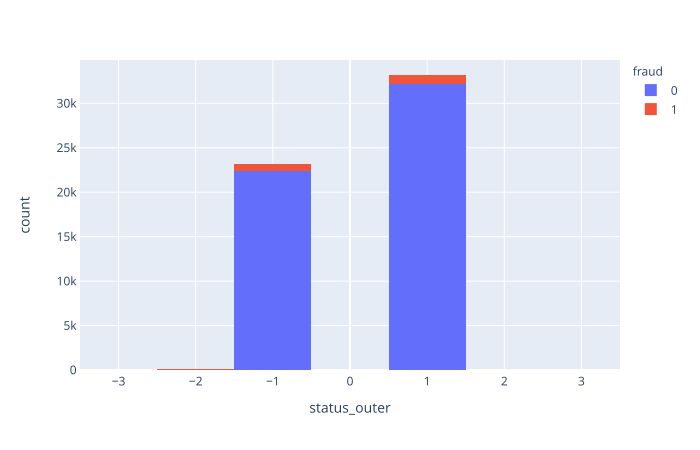

count    56428.000000
mean         0.171617
std          0.989516
min         -3.000000
25%         -1.000000
50%          1.000000
75%          1.000000
max          3.000000
Name: status_outer, dtype: float64
complete_verification
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

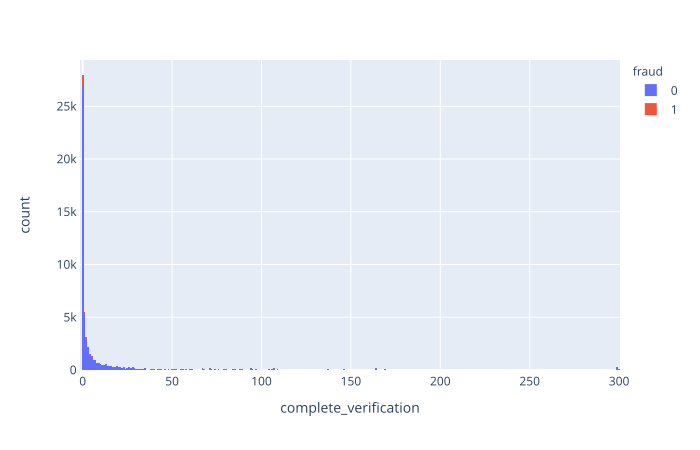

count    56428.000000
mean        11.562239
std         33.790910
min         -1.000000
25%          0.000000
50%          1.000000
75%          6.000000
max        300.000000
Name: complete_verification, dtype: float64
decline_verification
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

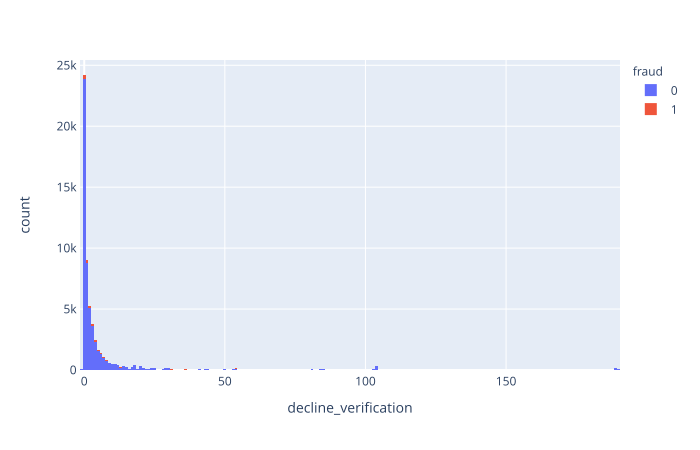

count    56428.000000
mean         5.348373
std         17.822242
min         -1.000000
25%          0.000000
50%          1.000000
75%          3.000000
max        190.000000
Name: decline_verification, dtype: float64
review_answer
Percentage of missing values:  7.0
Count of missing values:  4067


<IPython.core.display.Javascript object>

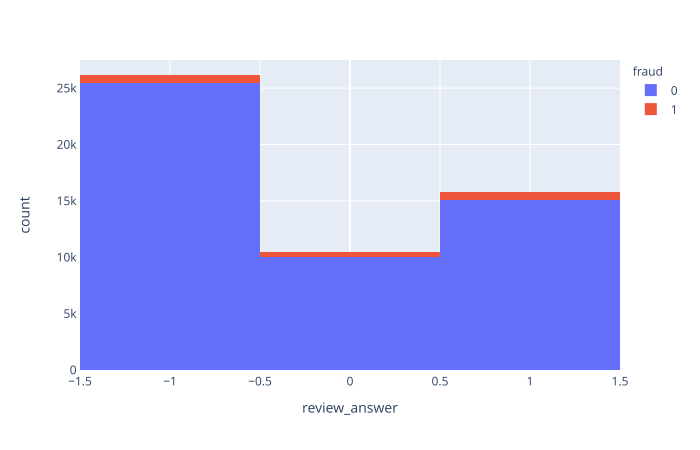

count    52361.000000
mean        -0.197991
std          0.872096
min         -1.000000
25%         -1.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: review_answer, dtype: float64
phone_type
Percentage of missing values:  0.0
Count of missing values:  4


<IPython.core.display.Javascript object>

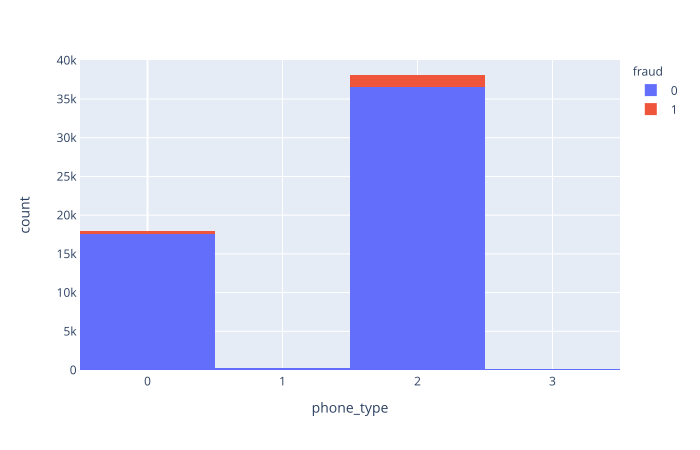

count    56424.000000
mean         1.361743
std          0.935162
min          0.000000
25%          0.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: phone_type, dtype: float64
phone_status
Percentage of missing values:  0.0
Count of missing values:  4


<IPython.core.display.Javascript object>

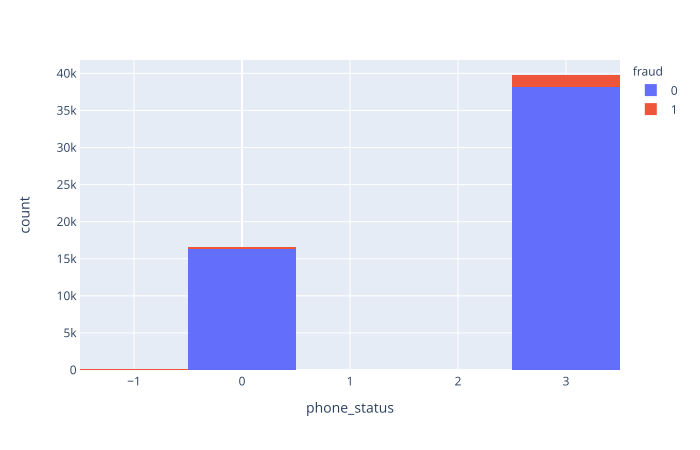

count    56424.000000
mean         2.110538
std          1.371844
min         -1.000000
25%          0.000000
50%          3.000000
75%          3.000000
max          3.000000
Name: phone_status, dtype: float64
phone_additional_status
Percentage of missing values:  0.0
Count of missing values:  4


<IPython.core.display.Javascript object>

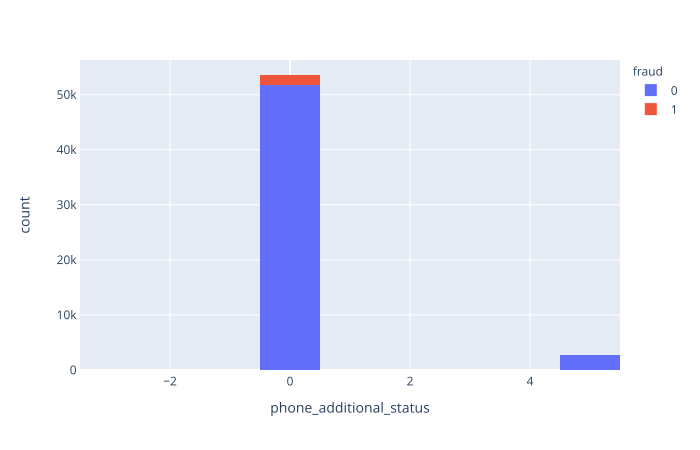

count    56424.000000
mean         0.252251
std          1.096748
min         -3.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: phone_additional_status, dtype: float64
card_count
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

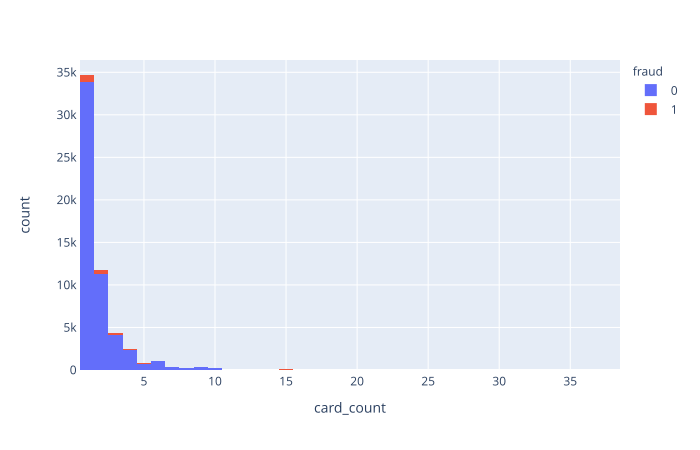

count    56428.000000
mean         1.889470
std          2.101689
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         38.000000
Name: card_count, dtype: float64
ip_cnt
Percentage of missing values:  0.0
Count of missing values:  0


<IPython.core.display.Javascript object>

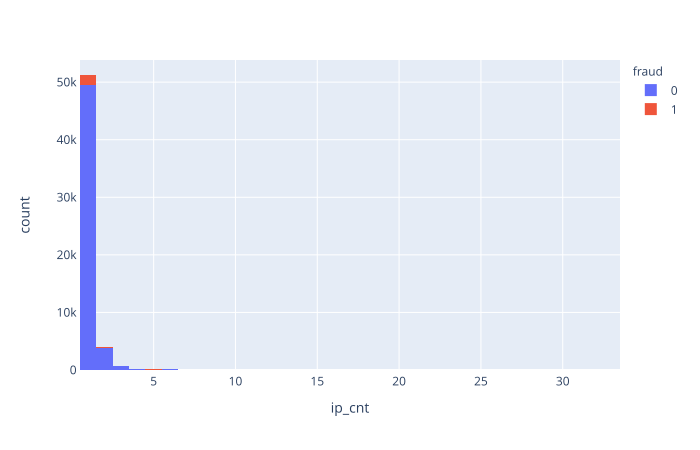

count    56428.000000
mean         1.161232
std          0.833096
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         33.000000
Name: ip_cnt, dtype: float64


In [13]:
for col in df.columns[df.dtypes!=object]:
    num_col_analyse(col)

As we can see the numerical data are in need of additional cleaning and preprocessing.

domain
Percentage of missing values:  0.0
Count of missing values:  1


<IPython.core.display.Javascript object>

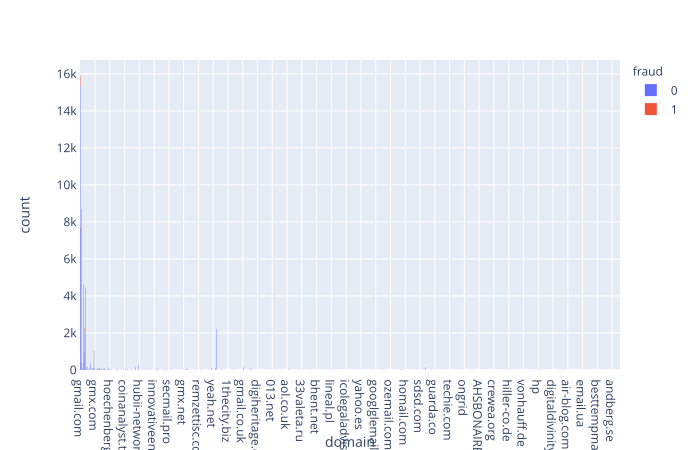

count         56427
unique         1060
top       gmail.com
freq          15914
Name: domain, dtype: object
locality
Percentage of missing values:  29.0
Count of missing values:  16582


<IPython.core.display.Javascript object>

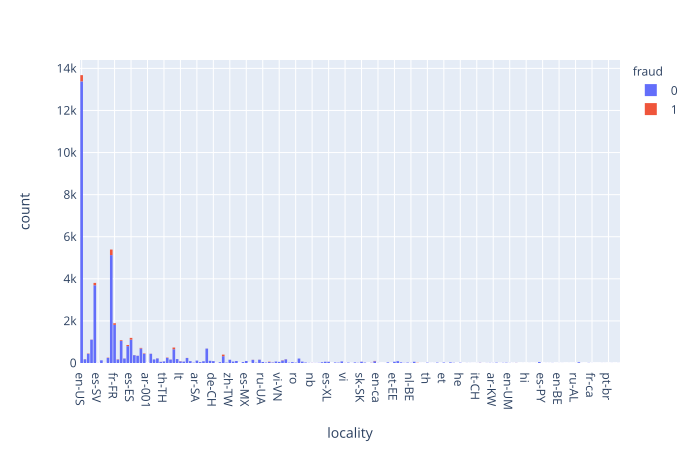

count     39846
unique      164
top       en-US
freq      13678
Name: locality, dtype: object
os
Percentage of missing values:  29.0
Count of missing values:  16613


<IPython.core.display.Javascript object>

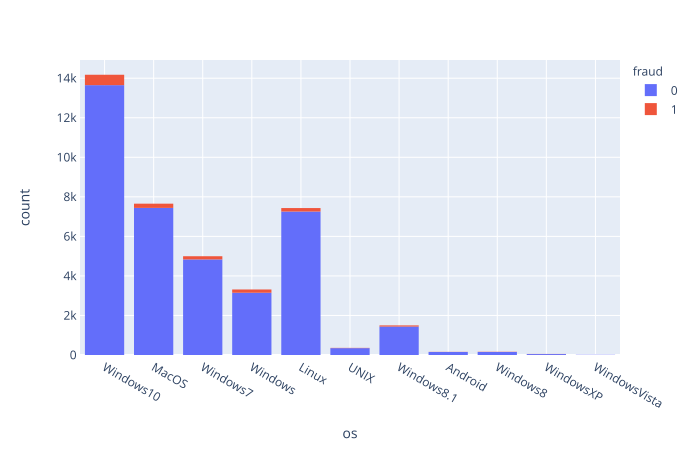

count         39815
unique           11
top       Windows10
freq          14175
Name: os, dtype: object
screen
Percentage of missing values:  29.0
Count of missing values:  16575


<IPython.core.display.Javascript object>

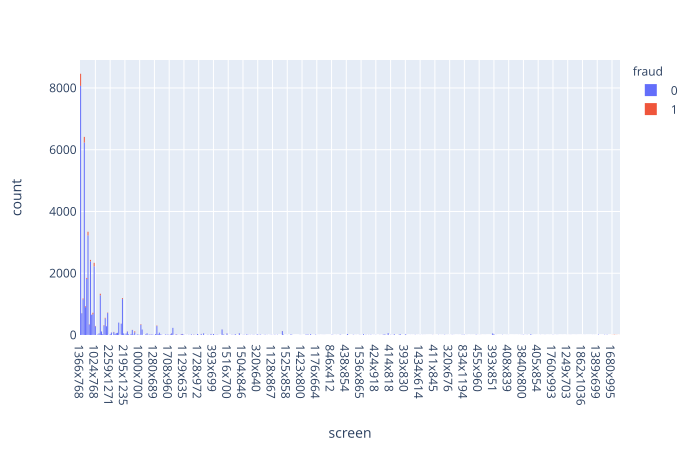

count        39853
unique         439
top       1366x768
freq          8460
Name: screen, dtype: object
ip_country
Percentage of missing values:  0.0
Count of missing values:  41


<IPython.core.display.Javascript object>

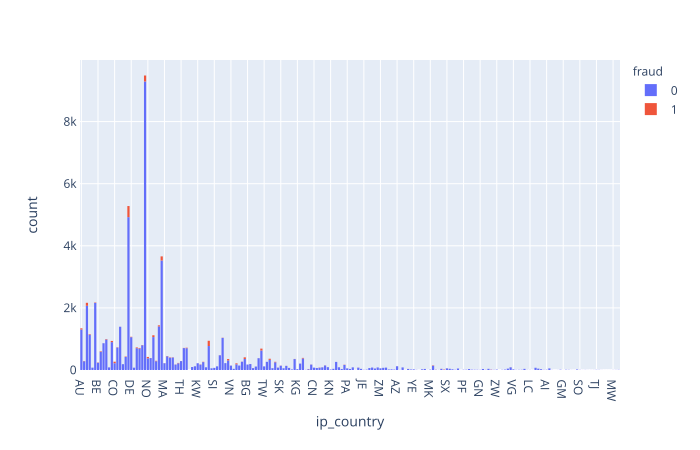

count     56387
unique      195
top          RU
freq       9484
Name: ip_country, dtype: object
country
Percentage of missing values:  0.0
Count of missing values:  144


<IPython.core.display.Javascript object>

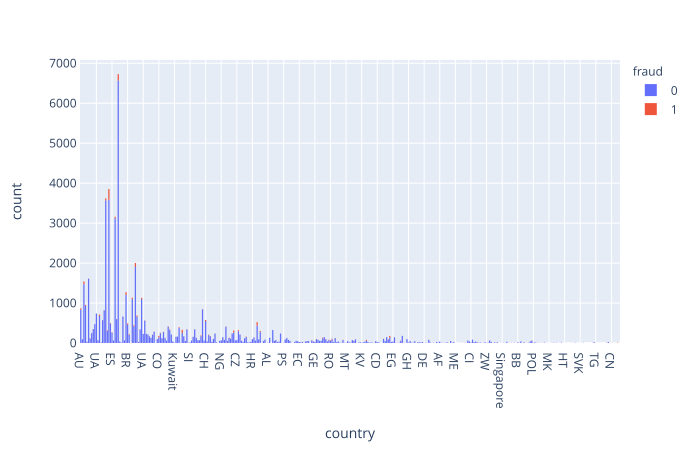

count          56284
unique           346
top       RU        
freq            6727
Name: country, dtype: object
phone_country
Percentage of missing values:  1.0
Count of missing values:  821


<IPython.core.display.Javascript object>

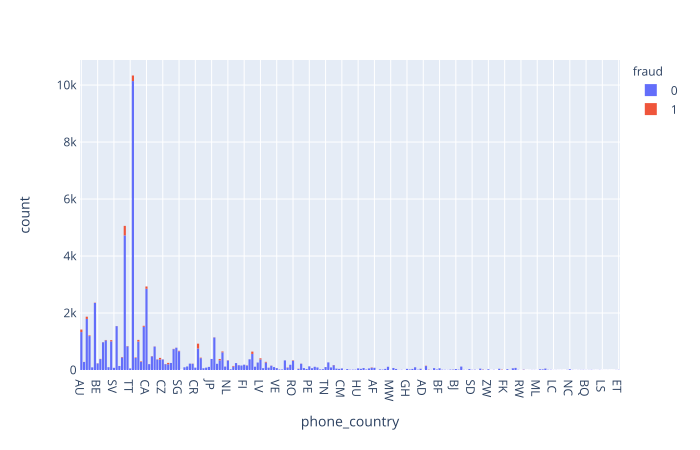

count     55607
unique      199
top          RU
freq      10335
Name: phone_country, dtype: object
phone_operator
Percentage of missing values:  35.0
Count of missing values:  19777


<IPython.core.display.Javascript object>

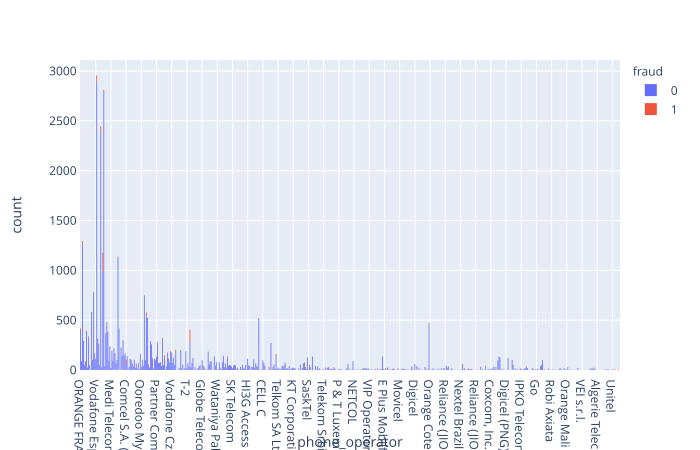

count       36651
unique        533
top       MegaFon
freq         2955
Name: phone_operator, dtype: object
ip_score
Percentage of missing values:  38.0
Count of missing values:  21570


<IPython.core.display.Javascript object>

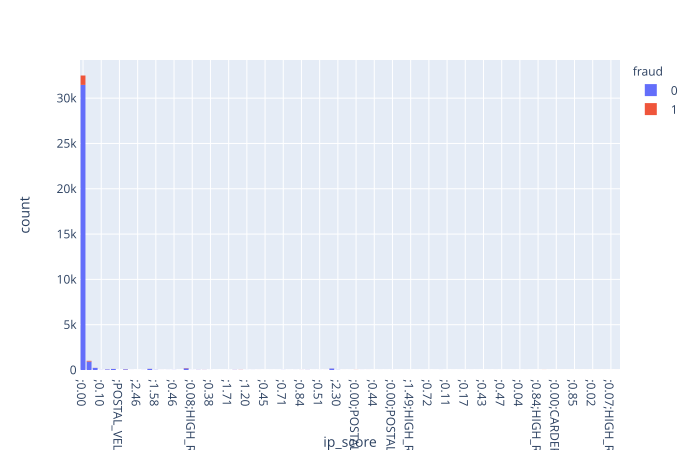

count     34858
unique       89
top       ;0.00
freq      32500
Name: ip_score, dtype: object
bank_url_reffer
Percentage of missing values:  9.0
Count of missing values:  5192


<IPython.core.display.Javascript object>

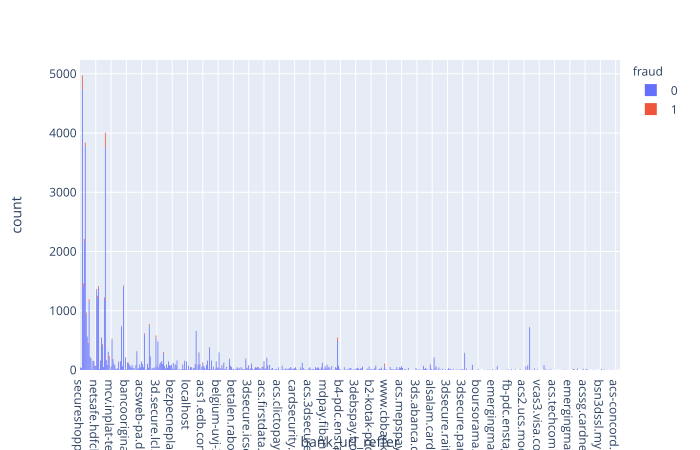

count                    51236
unique                     565
top       payment.quickpay.net
freq                      4971
Name: bank_url_reffer, dtype: object


In [14]:
for col in df.columns[df.dtypes==object]:
    num_col_analyse(col)

As we can see, the data needs to be cleaned up and grouped.

# Data preparation 

In [15]:
# date data
df['day'] = df['created_at'].dt.day
df['weekday'] = df['created_at'].dt.weekday + 1
df['hour'] = df['created_at'].dt.hour

In [16]:
# remove outliers according to the age and score
df['age'] = df['age'].mask(((df.age < 15) | (df.age > 100)), np.nan)
df['emailage_score'] = df['emailage_score'].mask(((df.emailage_score < 0)
                                                  | (df.emailage_score > 1000)),
                                                 np.nan)
df['risk_score'] = df['risk_score'].mask(((df.risk_score < 0)
                                          | (df.risk_score > 100)), np.nan)
# remove outliers according to the verification
df['complete_verification'] = df['complete_verification'].\
                                mask((df.complete_verification < 0), 0)
df['decline_verification'] = df['decline_verification'].\
                                mask((df.decline_verification < 0), 0)
# drop spase from string
df['phone_operator'] = pd.core.strings.str_strip(df['phone_operator'])
df['bank_url_reffer'] = pd.core.strings.str_strip(df['bank_url_reffer'])
# str to one format
df['bank_url_reffer'] = df.bank_url_reffer.str.upper()
df['phone_operator'] = df.phone_operator.str.upper()
df['locality'] = df.locality.str.upper()
df['domain'] = df.domain.str.upper()

In [17]:
df['country'] = pd.core.strings.str_strip(df['country'])
df['country'] = df['country'].apply(lambda x: country_fix(x))
df['ip_country'] = np.where(df['ip_country'] == 'T1', np.nan, df['ip_country'])
df['country'] = np.where(df['country'] == 'UNDEFINED', np.nan, df['country'])
df['country'] = np.where(df['country'] == 'United Kingdom',
                         'GB', df['country'])
df['country'] = np.where(df['country'] == 'GER', 'DE', df['country'])
df['country'] = np.where(df['country'] == 'nan', np.nan, df['country'])
df['country'] = np.where(df['country'] == 'T1', np.nan, df['country'])
df['ip_country'] = np.where(df['ip_country'] == 'T1', np.nan, df['ip_country'])
df['phone_country'] = np.where(df['phone_country'] == '001', np.nan, df['phone_country'])

In [18]:
# drop old companie
df.drop(df[df.domain == 'PANTEAM'].index, inplace=True)

In [19]:
df.shape

(56365, 39)

In [20]:
# main operator
Operator = ['A1', 'AIRTEL', 'AT&T', 'BEELINE', 'CELLCOM',
            'CELTEL', 'CHINA MOBILE', 'CLARO', 'DIGICEL',
            'DIGITEL', 'ELISA', 'ENFLICK', 'ENTEL', 'ETISALAT',
            'H3G', 'HUTCHISON', 'KPN', 'LIFE:)', 'LIME', 'MOVISTAR',
            'MAXIS', 'MTN', 'MTS', 'OOREDOO', 'ORANGE', 'RELIANCE',
            'SURE', 'TELE2', 'TELENOR', 'TELIA ', 'TELIASONERA', 'TIM',
            'T-MOBILE', 'U MOBILE', 'VODACOM', 'VODAFONE', 'WIND',
            'ZAIN', 'TELEFONICA'] 

In [21]:
for i in range(len(Operator)):
    df['phone_operator'] = df['phone_operator'].apply(lambda x: clean(str(x)))

In [22]:
df.phone_operator.replace('UNKNOWN', np.nan, inplace=True)
df.phone_operator.replace('nan', np.nan, inplace=True)
df['phone_operator'] = np.where(df['phone_operator'] == 'BEELINE',
                                'VIMPEL COMMUNICATIONS',
                                df['phone_operator'])
df.phone_operator.value_counts()

MTS                            3335
MEGAFON                        2955
VIMPEL COMMUNICATIONS          2528
VODAFONE                       2425
ORANGE                         1913
                               ... 
HPT MOSTAR (HT D.D. MOSTAR)       1
VEI S.R.L.                        1
GIBTELECOM                        1
E PLUS MOBILFUNK                  1
MANX TELECOM TRADING              1
Name: phone_operator, Length: 338, dtype: int64

In [23]:
# clean bank url
df.bank_url_reffer = df.bank_url_reffer.fillna('9Minus9')
df['bank'] = df.apply(lambda r: r.bank_url_reffer.partition('.')[2], axis=1)
df.bank.replace('', np.nan, inplace=True)

In [24]:
null_value_stats = df.isnull().sum()
null_value_stats[null_value_stats != 0]

age                        26113
emailage_score             45965
risk_score                 34667
domain                         1
locality                   16582
os                         16613
screen                     16575
timezone                   16575
phone_verif_count          16711
phone_count                    4
phone_count_not_verif      37079
ip_country                   103
country                      272
phone_country                822
phone_operator             19728
ip_score                   21547
review_answer               4067
phone_type                     4
phone_status                   4
phone_additional_status        4
bank                        5191
dtype: int64

In [25]:
# drop nan from domain
df.dropna(subset=['domain'], inplace=True)

In [26]:
# replace the nans with 0, because the absence of values in these columns is 0
df.complete_verification = df.complete_verification.fillna(0)
df.decline_verification = df.decline_verification.fillna(0)
df.count_by_card = df.count_by_card.fillna(0)
df.card_count = df.card_count.fillna(0)
df.phone_verif_count = df.phone_verif_count.fillna(0)
df.phone_count_not_verif = df.phone_count_not_verif.fillna(0)
df.phone_count = df.phone_count.fillna(0)
df.phone_type = df.phone_type.fillna(0)
df.phone_additional_status = df.phone_additional_status.fillna(0)
df.phone_status = df.phone_status.fillna(0)

In [27]:
# clean ip_score
df['ip_score'] = df.ip_score.str.findall(r'\d.\d\d').str[0].astype(float)

In [28]:
nn_count(df, quartile=95)  # infrequent values in others

['domain', 'locality', 'os', 'screen', 'ip_country', 'country', 'phone_country', 'phone_operator', 'bank_url_reffer', 'bank']


In [29]:
# check country match
df['country_match_phone'] = (df.country == df.phone_country)
df['country_match_ip'] = (df.country == df.ip_country)
df['country_match_phone_ip'] = (df.phone_country == df.ip_country)
df['country_match_all'] = (df.country_match_phone == df.country_match_ip)

In [30]:
# cumulitive amount
df['cum_amount'] = df.groupby('identification_id')['amount'].cumsum()

# count of unique values for person
for col in [
           'locality', 'os',
           'screen', 'timezone',
           'currency_id', 'amount',
           'count', 'num_in_day_compl', 'status_outer', 'ip_country',
           'country', 'phone_country', 'phone_operator', 'ip_score',
           'complete_verification', 'decline_verification',
           'review_answer', 'ip_cnt', 'day', 'weekday',
           'hour', 'bank']:
    agg_func_nuniq('identification_id', col)

In [31]:
# statistic for person
agg_func('identification_id', 'amount', 'first')
agg_func('identification_id', 'amount', 'mean')
agg_func('identification_id', 'amount', 'max')
agg_func('identification_id', 'amount', 'std')
agg_func('identification_id', 'amount', 'min')
agg_func('identification_id', 'emailage_score', 'std')
agg_func('identification_id', 'emailage_score', 'first')
agg_func('identification_id', 'emailage_score', 'mean')
agg_func('identification_id', 'emailage_score', 'max')
agg_func('identification_id', 'emailage_score', 'min')
agg_func('identification_id', 'risk_score', 'std')
agg_func('identification_id', 'risk_score', 'first')
agg_func('identification_id', 'risk_score', 'mean')
agg_func('identification_id', 'risk_score', 'max')
agg_func('identification_id', 'risk_score', 'min')
agg_func('identification_id', 'ip_score', 'std')
agg_func('identification_id', 'ip_score', 'first')
agg_func('identification_id', 'ip_score', 'mean')
agg_func('identification_id', 'ip_score', 'max')
agg_func('identification_id', 'ip_score', 'min')

In [32]:
# convert statuses
df['phone_status'] = np.where(df['phone_status'] == 2, 0, df['phone_status'])
df['phone_additional_status'] = np.where(df['phone_additional_status'] == -1, 0,
                                         df['phone_additional_status'])
df['phone_additional_status'] = np.where(df['phone_additional_status'] == 4, 3,
                                         df['phone_additional_status'])
df['phone_additional_status'] = np.where(df['phone_additional_status'] == -2, 0,
                                         df['phone_additional_status'])
df['phone_additional_status'] = np.where(df['phone_additional_status'] == 1, 0,
                                         df['phone_additional_status'])

In [33]:
# removing unnecessary columns
df.drop('identification_id', axis=1, inplace=True)
df.drop('bank_url_reffer', axis=1, inplace=True)

In [34]:
# check nans
null_value_stats = df.isnull().sum()
null_value_stats[null_value_stats != 0]

age                     26113
emailage_score          45964
risk_score              34666
locality                16582
os                      16613
screen                  16575
timezone                16575
ip_country                103
country                   272
phone_country             822
phone_operator          19727
ip_score                21556
review_answer            4067
bank                     5191
std_amount              15217
std_emailage_score      46399
first_emailage_score    38212
mean_emailage_score     38212
max_emailage_score      38212
min_emailage_score      38212
std_risk_score          34197
first_risk_score        17142
mean_risk_score         17142
max_risk_score          17142
min_risk_score          17142
std_ip_score            26997
first_ip_score          14107
mean_ip_score           14107
max_ip_score            14107
min_ip_score            14107
dtype: int64

In [35]:
cat_features = ['source_type', 'domain', 'locality', 'os',
                'screen', 'currency_id', 'status_outer',
                'ip_country', 'country', 'phone_country',
                'phone_operator', 'bank', 'review_answer',
                'phone_type', 'phone_status', 'phone_additional_status',
                'country_match_phone', 'country_match_ip', 'timezone',
                'country_match_phone_ip', 'country_match_all']
num_col = ['age', 'day_from_create', 'emailage_score',
           'risk_score', 'count_by_card',
           'phone_verif_count', 'phone_count', 'phone_count_not_verif',
           'amount', 'count', 'num_in_day_compl', 'ip_score',
           'complete_verification', 'decline_verification',
           'card_count', 'ip_cnt', 'day', 'weekday', 'hour',
           'cum_amount', 'ncount_locality', 'ncount_os',
           'ncount_screen', 'ncount_timezone',
           'ncount_currency_id', 'ncount_amount',
           'ncount_count', 'ncount_num_in_day_compl', 'ncount_status_outer',
           'ncount_ip_country', 'ncount_country', 'ncount_phone_country',
           'ncount_phone_operator', 'ncount_ip_score',
           'ncount_complete_verification', 'ncount_decline_verification',
           'ncount_review_answer', 'ncount_ip_cnt',
           'ncount_day', 'ncount_weekday', 'ncount_hour', 'ncount_bank',
           'first_amount', 'mean_amount', 'max_amount', 'std_amount', 'min_amount',
           'std_emailage_score', 'first_emailage_score', 'mean_emailage_score',
           'max_emailage_score', 'min_emailage_score', 'std_risk_score',
           'first_risk_score', 'mean_risk_score', 'max_risk_score',
           'min_risk_score', 'std_ip_score', 'first_ip_score', 'mean_ip_score',
           'max_ip_score', 'min_ip_score']

In [36]:
for col in num_col:
    df[col] = np.log1p(df[col])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



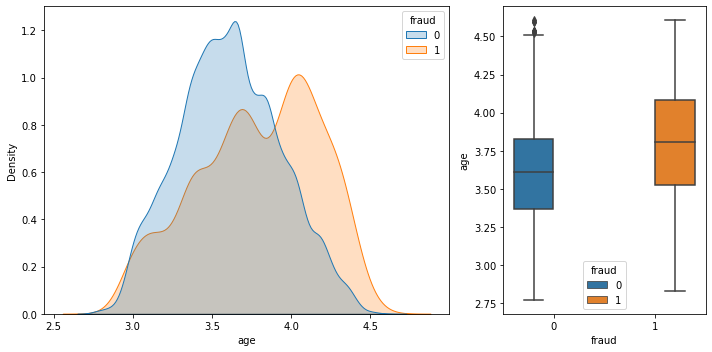

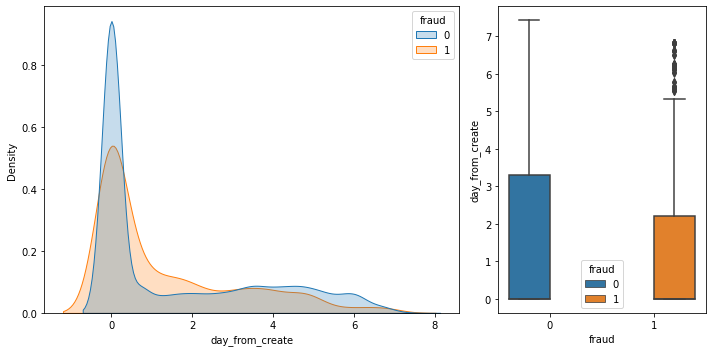

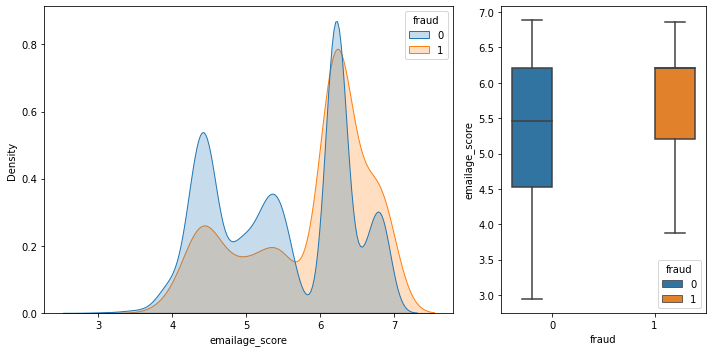

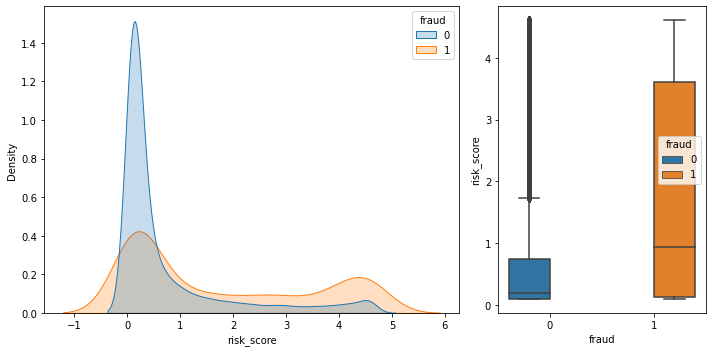

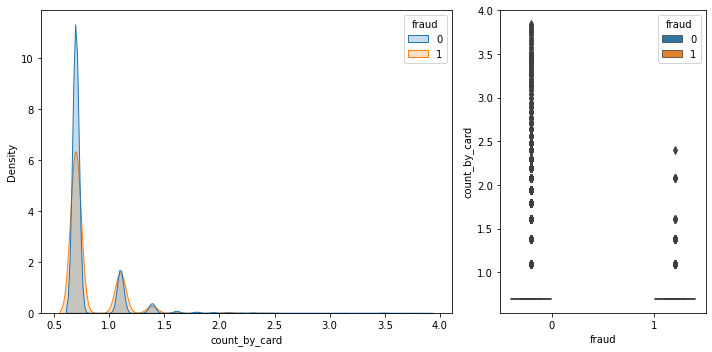

...

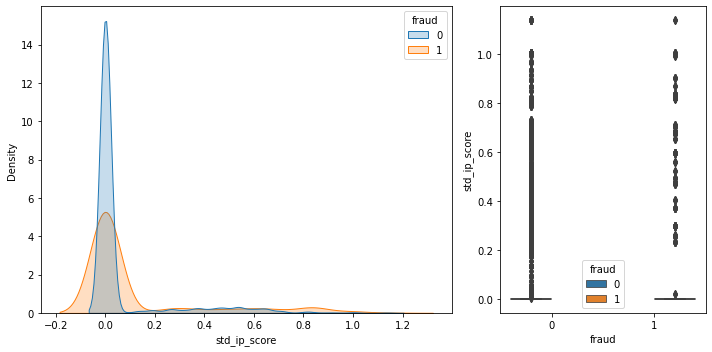

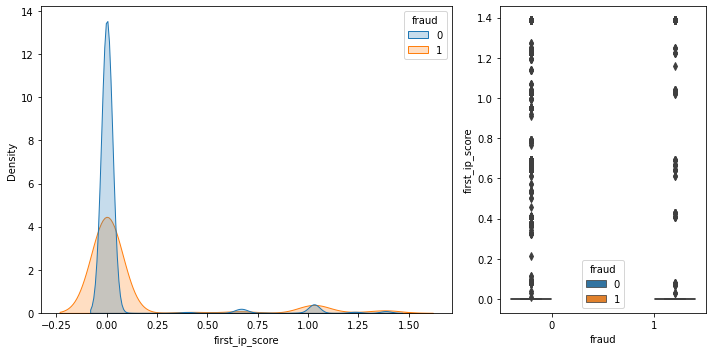

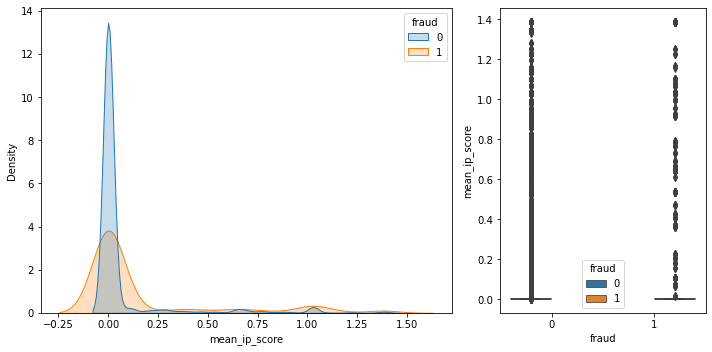

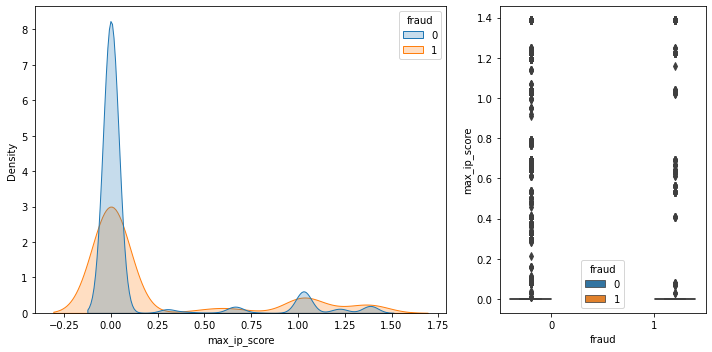

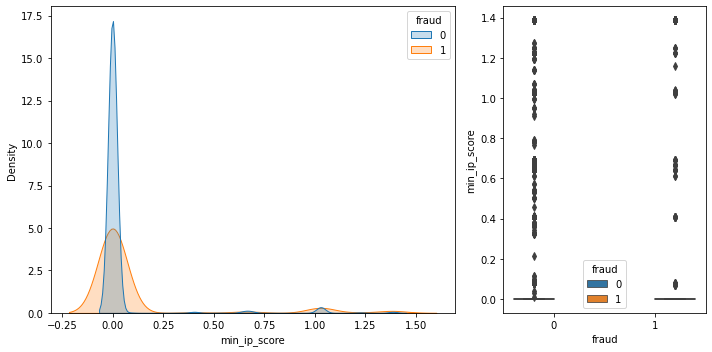

In [37]:
for col in num_col:
    f, axs = plt.subplots(1, 2,
                          figsize=(10, 5),
                          gridspec_kw=dict(width_ratios=[4, 2]))
    sns.kdeplot(data=df, x=col, hue="fraud",
                fill=True, common_norm=False, ax=axs[0])
    sns.boxplot(x='fraud', y=col, hue="fraud", data=df, ax=axs[1])
    f.tight_layout()

In [38]:
for col in num_col:
    print(col)
    outliers_iqr(df[col])

age
Lower bound: nan Upper bound: nan
0
day_from_create
Lower bound: -4.887144807032223 Upper bound: 8.145241345053705
0
emailage_score
Lower bound: nan Upper bound: nan
0
risk_score
Lower bound: nan Upper bound: nan
0
count_by_card
Lower bound: 0.6931471805599453 Upper bound: 0.6931471805599453
9864
phone_verif_count
Lower bound: -1.0397207708399179 Upper bound: 1.732867951399863
0
phone_count
Lower bound: 0.6931471805599453 Upper bound: 0.6931471805599453
10052
phone_count_not_verif
Lower bound: -1.0397207708399179 Upper bound: 1.732867951399863
303
amount
Lower bound: 1.3289728046721563 Upper bound: 7.687904170091228
967
count
Lower bound: 0.0849495183976986 Upper bound: 1.7068099508303565
2314
num_in_day_compl
Lower bound: 0.0849495183976986 Upper bound: 1.7068099508303565
1677
ip_score
Lower bound: nan Upper bound: nan
0
complete_verification
Lower bound: -2.9188652235829697 Upper bound: 4.864775372638283
882
decline_verification
Lower bound: -2.0794415416798357 Upper bound: 3.465

We will not remove the outliers yet.

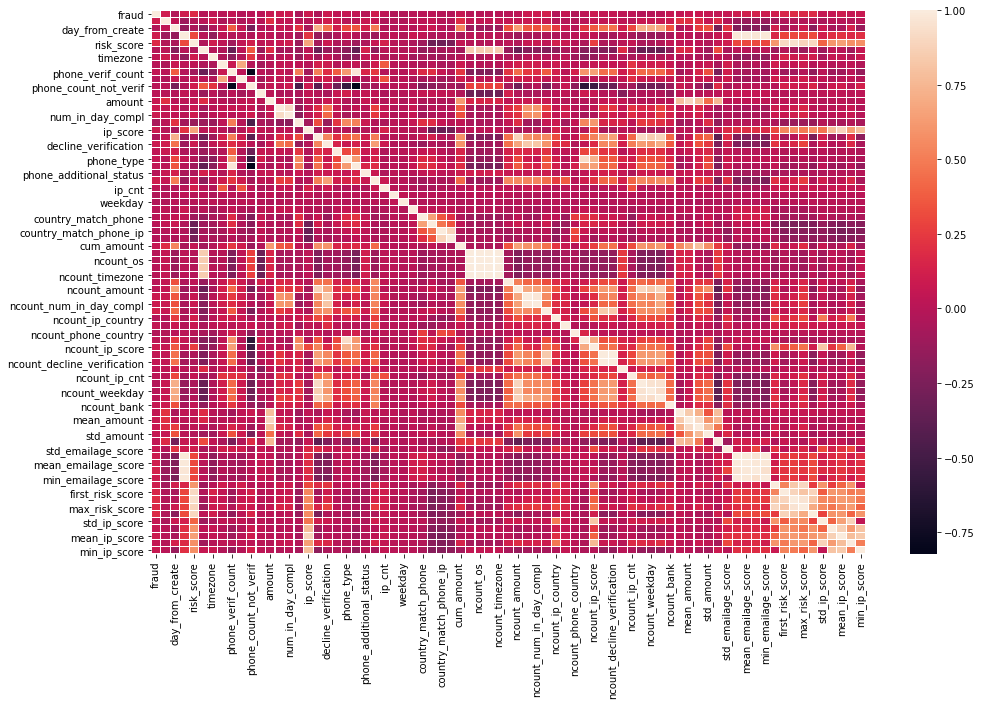

In [39]:
corr_matrix = df.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(corr_matrix, linewidths=.1);

In [40]:
# replace nans на -99999
df.fillna(int(-99999), inplace=True)

In [41]:
df['review_answer'] = df.review_answer.astype(int)
df['phone_type'] = df.phone_type.astype(int)
df['phone_status'] = df.phone_status.astype(int)
df['phone_additional_status'] = df.phone_additional_status.astype(int)
df['timezone'] = df.timezone.astype(int)

In [42]:
# drop strongly correlated columns
df = remove_collinear_features(df, 0.9)

Drop {'ncount_day', 'ncount_locality', 'phone_status', 'first_ip_score', 'ncount_review_answer', 'mean_ip_score', 'min_ip_score', 'ncount_os', 'max_risk_score', 'ncount_hour', 'min_risk_score', 'max_ip_score', 'ncount_screen', 'max_emailage_score', 'ncount_timezone', 'ncount_phone_operator', 'mean_amount', 'min_emailage_score'}


In [43]:
cat_features_new = []
for col in cat_features:
    if col in df.columns:
        cat_features_new.append(col)
cat_features = cat_features_new.copy()

In [44]:
numeric_col = []
for col in num_col:
    if col in df.columns:
        numeric_col.append(col)

In [45]:
categories = [df[column].unique() for column in df[cat_features]]

In [46]:
categories

[array([1, 0], dtype=int64),
 array(['GMAIL.COM', 'CHANGELLY', 'IPHONE', 'OUTLOOK.COM', 'other',
        'HOTMAIL.IT', 'PROTONMAIL.COM', 'WAVES', 'MAIL.RU', 'HOTMAIL.COM',
        'ANDROID', 'ICLOUD.COM', 'MAIL.COM', 'LIBERO.IT', 'YANDEX.RU',
        'BK.RU', 'TRUSTWALLET', 'OUTLOOK.ES', 'MSN.COM', 'YAHOO.IT',
        'YAHOO.COM', 'YAHOO.CO.UK', 'BYTEBALL', 'YANDEX.COM', 'ORANGE.FR',
        'ME.COM', 'YA.RU', 'HOTMAIL.FR', 'INBOX.RU', 'YAHOO.FR', 'SFR.FR',
        'RAMBLER.RU', 'LIST.RU', 'INBOX.LV', 'OUTLOOK.FR', 'LIVE.COM',
        'GMX.DE', 'NAVER.COM', 'OUTLOOK.IT', 'AOL.COM', 'HOTMAIL.CO.UK',
        'WEB.DE', 'ALPHA-CRYPTO', 'YAHOO.CA', 'WP.PL', 'TOKENSALE',
        'COINSWITCH', 'PAYTIZ', 'CRYPTOWOLFBTC', 'HAMSTERSPAY',
        'CRYPTOSOCRAT', 'XZEN', 'HP'], dtype=object),
 array(['EN-US', 'other', 'IT-IT', 'EN-GB', -99999, 'RU-RU', 'FR-FR', 'RU',
        'PT-BR', 'ES-ES'], dtype=object),
 array(['Windows10', 'other', -99999], dtype=object),
 array(['1366x768', '375x812', '1280

In [47]:
cat_proc_lin = make_pipeline(
    SimpleImputer(strategy='constant',
                  fill_value=int(-99999)),
    OneHotEncoder(categories=categories, drop='if_binary')
)

num_proc_lin = make_pipeline(
    SimpleImputer(
                  strategy='constant',
                  fill_value=int(-99999))
)


processor_lin = make_column_transformer(
    (cat_proc_lin, cat_features),
    (num_proc_lin, numeric_col),
    remainder='drop')

## Split data 

In [48]:
X_train = df[df['created_at'] < '2019-03-15'].drop(['fraud',
                                                    'created_at'], axis=1)
y_train = df[df['created_at'] < '2019-03-15'].fraud

X_valid = df[df['created_at'] > '2019-05-15'].drop(['fraud',
                                                    'created_at'], axis=1)
y_valid = df[df['created_at'] > '2019-05-15'].fraud

X_test = df[~((df['created_at'] > '2019-05-15')
              | (df['created_at'] < '2019-03-15'))].drop(['fraud',
                                                          'created_at'], axis=1)
y_test = df[~((df['created_at'] > '2019-05-15')
              | (df['created_at'] < '2019-03-15'))].fraud

In [49]:
scale_pos_weight = 35

In [50]:
print('Labels y_train: {}'.format(set(y_train)))
print('Zero count = {}, One count = {}'.
      format(len(y_train) - sum(y_train), sum(y_train)))
print(sum(y_train)/(len(y_train) - sum(y_train)))

print('Labels y_test: {}'.format(set(y_test)))
print('Zero count = {}, One count = {}'.
      format(len(y_test) - sum(y_test), sum(y_test)))
print(sum(y_test)/(len(y_test) - sum(y_test)))

print('Labels y_validation: {}'.format(set(y_valid)))
print('Zero count = {}, One count = {}'.
      format(len(y_valid) - sum(y_valid), sum(y_valid)))
print(sum(y_valid)/(len(y_valid) - sum(y_valid)))

Labels y_train: {0, 1}
Zero count = 32567, One count = 1193
0.036632173672736204
Labels y_test: {0, 1}
Zero count = 11036, One count = 342
0.030989488945270025
Labels y_validation: {0, 1}
Zero count = 10961, One count = 265
0.02417662622023538


In [51]:
sample_weight = X_train.amount
train_dataset = Pool(X_train,
                     label=y_train,
                     cat_features=cat_features,
                     weight=X_train.amount)

In [52]:
eval_dataset = Pool(X_valid,
                    label=y_valid,
                    cat_features=cat_features,
                    weight=X_valid.amount)


In [53]:
test_dataset = Pool(X_test,
                    label=y_test,
                    cat_features=cat_features,
                    weight=X_test.amount)


# Сompare default model

In [54]:
clfs = [make_pipeline(processor_lin,
                      CatBoostClassifier(random_state=seed,
                                         verbose=False,
                                         scale_pos_weight=scale_pos_weight)),
        make_pipeline(processor_lin,
                      xgb.XGBClassifier(random_state=seed,
                                        scale_pos_weight=scale_pos_weight)),
        make_pipeline(processor_lin,
                      lgb.LGBMClassifier(random_state=seed,
                                         is_unbalance=True)),
        make_pipeline(processor_lin,
                      RandomForestClassifier(random_state=seed,
                                             class_weight='balanced'))]
for cls in clfs:
    cls.fit(X_train, y_train)

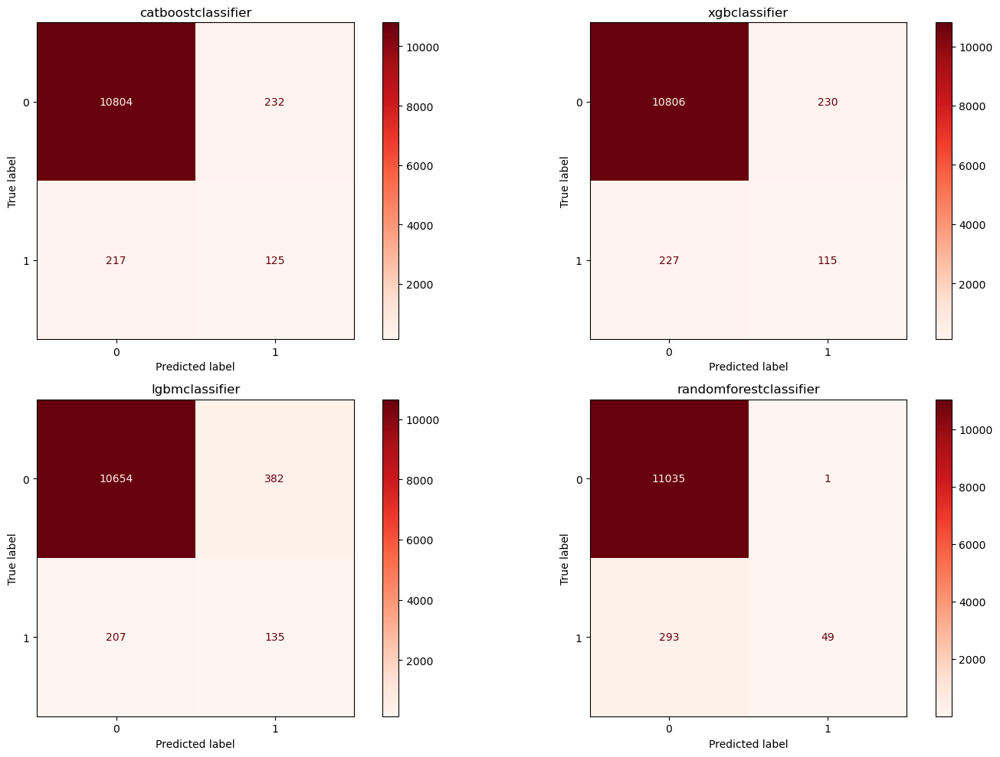

In [55]:
confusion_matrix_plot(clfs)

In [56]:
metrics = get_scores(clfs)
metrics

,Name,Accuracy,AUC Score,Precision,Recall,F1-Score,Logloss
0,catboostclassifier,0.960538,0.672237,0.350140,0.365497,0.357654,1.362990
1,xgbclassifier,0.959835,0.657708,0.333333,0.336257,0.334789,1.387274
2,lgbmclassifier,0.948233,0.680061,0.261122,0.394737,0.314319,1.787981
3,randomforestclassifier,0.974161,0.571592,0.980000,0.143275,0.250000,0.892459


Boosters by default give approximately the same result.
Therefore, for the convenience of further processing of categories, only Сatboost.

# Model training

In [57]:
model = CatBoostClassifier(scale_pos_weight=scale_pos_weight,
                           eval_metric='AUC',
                           early_stopping_rounds=250)

model.fit(train_dataset,
          use_best_model=True,
          eval_set=test_dataset,
          verbose=False,
          plot=False)

In [58]:
f_imp = model.get_feature_importance(prettified=True)
f_imp

,Feature Id,Importances
0,ncount_weekday,10.704804
1,complete_verification,7.465769
2,age,6.858633
3,max_amount,4.187775
4,mean_risk_score,3.976910
...,...,...
60,num_in_day_compl,0.098732
61,ncount_phone_country,0.068936
62,count,0.056993
63,country_match_phone,0.000000


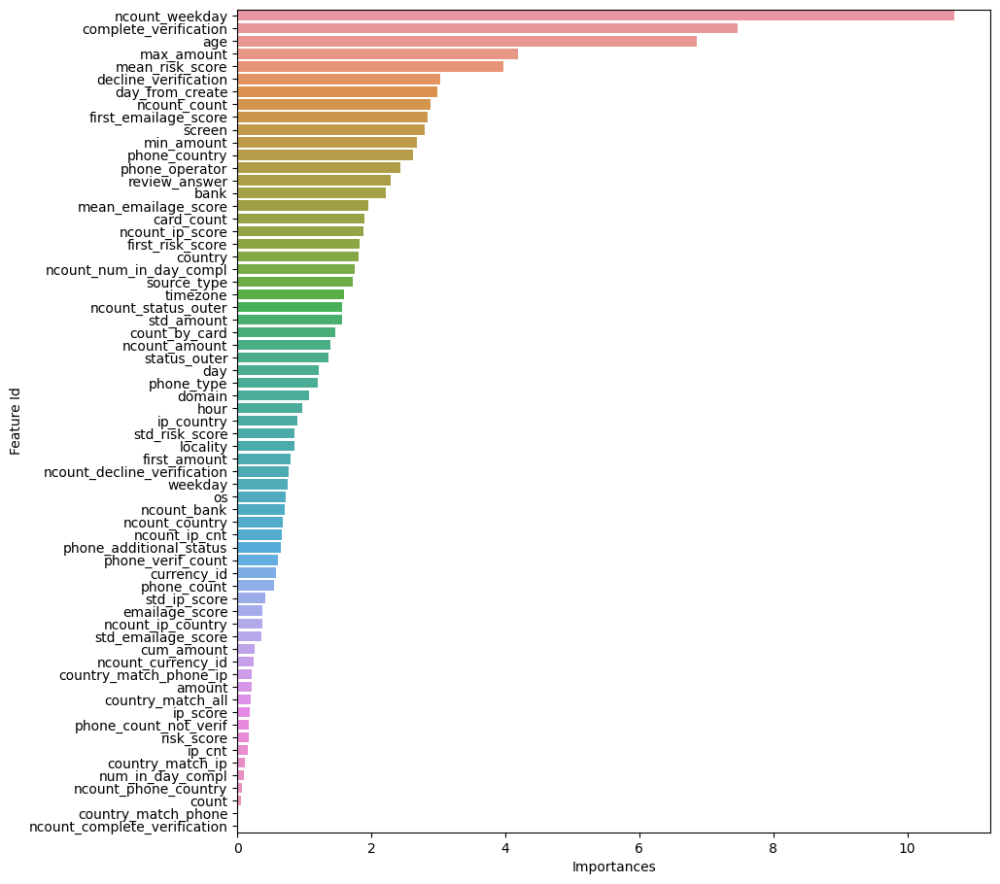

In [59]:
plt.figure(figsize=(10, 11))
sns.barplot(data=f_imp, x='Importances', y='Feature Id');

In [60]:
# cut down by feature importance
X_test = X_test[f_imp[f_imp.Importances >= 0.1]['Feature Id'].values]
X_train = X_train[f_imp[f_imp.Importances >= 0.1]['Feature Id'].values]
X_valid = X_valid[f_imp[f_imp.Importances >= 0.1]['Feature Id'].values]
cat_f = []
for i in cat_features:
    if i in f_imp[f_imp.Importances > 0]['Feature Id'].values:
        cat_f.append(i)
train_dataset = Pool(X_train,
                     label=y_train,
                     cat_features=cat_f,
                     weight=X_train.amount)
test_dataset = Pool(X_test,
                    label=y_test,
                    cat_features=cat_f,
                    weight=X_test.amount)
eval_dataset = Pool(X_valid,
                    label=y_valid,
                    cat_features=cat_f,
                    weight=X_valid.amount)

In [61]:
from catboost.utils import create_cd
import os

train_file = 'train.csv'
description_file = 'train.cd'
train_df = X_train.copy()
train_df['fraud'] = y_train
train_df.to_csv(train_file, header=False, index=False)

feature_names = dict()
for column, name in enumerate(train_df):
    if column == len(train_df.columns)-1:
        continue
    feature_names[column] = name
cat_features_num = []
for column, name in enumerate(train_df):
    if name in cat_features:
        cat_features_num.append(column)
create_cd(
    label=len(train_df.columns)-1,
    cat_features=cat_features_num,
    feature_names=feature_names,
    output_path='train.cd'
)

In [62]:
%%time
from catboost.eval.catboost_evaluation import *


learn_params = clfs[0][1].get_params()
s = clfs[0][1].get_all_params()
learn_params.update({'iterations': 500,
                     'learning_rate': s['learning_rate'],
                     'loss_function': 'Logloss'})

fold_size = 10000
fold_offset = 0
folds_count = 2
evaluator = CatboostEvaluation(train_file,
                               fold_size,
                               folds_count,
                               delimiter=',',
                               column_description=description_file,
                               partition_random_seed=seed)
result = evaluator.eval_features(learn_config=learn_params,
                                 eval_metrics=['AUC'],
                                 eval_type=EvalType.SeqRem,
                                 features_to_eval=list(range(1, X_train.columns.shape[0])))
# #                                  features_to_eval=[4])

Wall time: 1h 22min 1s


In [63]:
from catboost.eval.evaluation_result import *
logloss_result = result.get_metric_results('AUC')

In [64]:
logloss_result.get_baseline_comparison()

,PValue,Score,Quantile 0.005,Quantile 0.995,Decision,Overfit iter diff,Overfit iter pValue
Features: 1;3-59,0.5,56.087408,54.847723,57.327092,UNKNOWN,317.0,0.5
Features: 1-26;28-59,0.5,56.779548,55.819057,57.740039,UNKNOWN,415.0,0.5
Features: 1-35;37-59,0.5,56.904898,55.689361,58.120434,UNKNOWN,315.0,0.5
Features: 1-41;43-59,0.5,57.079086,55.671577,58.486595,UNKNOWN,276.5,0.5
Features: 1-46;48-59,0.5,57.129150,55.848556,58.409743,UNKNOWN,294.0,0.5
Features: 1-47;49-59,0.5,57.147279,55.725022,58.569537,UNKNOWN,269.5,0.5
Features: 1-21;23-59,0.5,57.151177,55.747551,58.554804,UNKNOWN,330.0,0.5
Features: 1-8;10-59,0.5,57.164659,56.120690,58.208628,UNKNOWN,362.0,0.5
Features: 1-37;39-59,0.5,57.167894,56.122916,58.212873,UNKNOWN,374.5,0.5
Features: 2-59,0.5,57.173045,55.953396,58.392693,UNKNOWN,357.5,0.5


There are neither strong nor very weak. Let's leave everything.

In [65]:
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=False)

iplot(logloss_result.create_fold_learning_curves(0))

In [66]:
params = {}

params['eval_metric'] = 'AUC'
params['loss_function'] = 'Logloss'
params['custom_loss'] = ['AUC', 'Precision', 'Recall', 'F1']
params['scale_pos_weight'] = scale_pos_weight

In [67]:
def hyperopt_objective(params):
    model = CatBoostClassifier(
        l2_leaf_reg=params['l2_leaf_reg'],
        bagging_temperature=params['bagging_temperature'],
        depth=int(params['depth']),
        scale_pos_weight=scale_pos_weight,
        learning_rate=params['learning_rate'],
        min_data_in_leaf=int(params['min_data_in_leaf']),
        leaf_estimation_iterations=int(params['leaf_estimation_iterations']),
        loss_function='Logloss',
        early_stopping_rounds=300,
        iterations=int(params['iterations']),
        max_ctr_complexity=int(params['max_ctr_complexity']),
        eval_metric='AUC',
        verbose=False
    )
    cv_data = cv(
        Pool(X_train, y_train, cat_features=cat_f,
             weight=X_train.amount),
        model.get_params(),
        fold_count=3,
        type='TimeSeries'
    )
    best_accuracy = np.max(cv_data['test-AUC-mean'])
    return 1 - best_accuracy  # as hyperopt minimises

In [68]:
# parameters for hyperperebor
params_space = {
    'l2_leaf_reg': hyperopt.hp.qloguniform('l2_leaf_reg', 0, 3, 1),
    'bagging_temperature': hyperopt.hp.qloguniform('bagging_temperature', 0, 2, 1),
    'depth': hyperopt.hp.uniform('depth', 5, 15),
    'learning_rate': hyperopt.hp.uniform('learning_rate', 1e-3, 0.5),
    'min_data_in_leaf': hyperopt.hp.uniform('min_data_in_leaf', 1, 5),
    'iterations': hyperopt.hp.quniform('iterations', 500, 5000, 250),
    'leaf_estimation_iterations': hyperopt.hp.uniform('leaf_estimation_iterations', 10, 64),
    'max_ctr_complexity': hyperopt.hp.uniform('max_ctr_complexity', 3, 6)
}

trials = hyperopt.Trials()

best = hyperopt.fmin(
    hyperopt_objective,
    space=params_space,
    algo=hyperopt.tpe.suggest,
    max_evals=20,
    trials=trials,
    rstate=RandomState(123)
)

print(best)

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector  (300 iterations wait)                                                                 

Stopped by overfitting detector 

In [69]:
model = CatBoostClassifier(
    l2_leaf_reg=int(best['l2_leaf_reg']),
    bagging_temperature=int(best['bagging_temperature']),
    depth=int(best['depth']),
    scale_pos_weight=scale_pos_weight,
    learning_rate=best['learning_rate'],
    loss_function='Logloss',
    min_data_in_leaf=int(best['min_data_in_leaf']),
    custom_loss=['Precision', 'Recall',
                 'F1', 'TotalF1'],
    early_stopping_rounds=300,
    iterations=1000,
    eval_metric='AUC')

cv_data = cv(Pool(X_train, y_train,
                  cat_features=cat_f,
                  weight=X_train.amount),
             model.get_params(), fold_count=3,
             type='TimeSeries',
             plot=True,
             verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Stopped by overfitting detector  (300 iterations wait)


In [70]:
best_iter = np.argmax(cv_data['test-AUC-mean'])
best_h = np.max(cv_data['test-AUC-mean'])
print('Precise validation accuracy score: {}'.format(np.max(cv_data['test-AUC-mean'])))

Precise validation accuracy score: 0.9136632374451921


In [71]:
model.fit(train_dataset,
          use_best_model=True,
          eval_set=test_dataset,
          verbose=False,
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [72]:
print(f'AUC on test: {roc_auc_score(y_test, model.predict_proba(test_dataset)[:, 1])}')

AUC on test: 0.8838511495605026


In [73]:
print(f'AUC on valid: {roc_auc_score(y_valid, model.predict_proba(eval_dataset)[:, 1])}')

AUC on valid: 0.8616955827952621


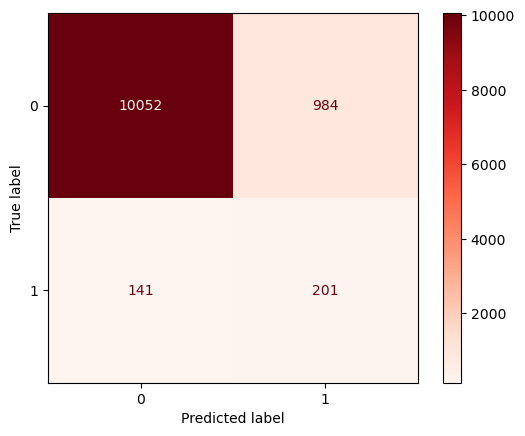

In [74]:
plot_confusion_matrix(model,
                      X_test,
                      y_test,
                      cmap='Reds',
                      values_format='d',
                      display_labels=df.fraud.
                      value_counts().index.to_list())

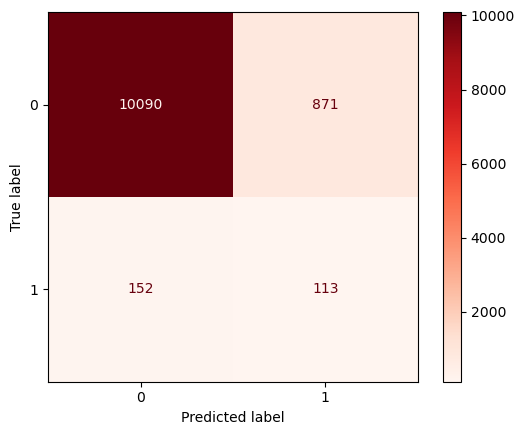

In [75]:
plot_confusion_matrix(model,
                      X_valid,
                      y_valid,
                      cmap='Reds',
                      values_format='d',
                      display_labels=df.fraud.
                      value_counts().index.to_list());

In [76]:
train_df['prob'] = model.predict_proba(train_dataset)[:, 1]
train_df['out'] = train_df.fraud - train_df.prob
train_df['out'] = train_df['out'].abs()
# drop outliers for model
train_dat = Pool(X_train[train_df.out < 0.70].sort_index(ascending=False),
                 label=y_train[train_df.out < 0.70].sort_index(ascending=False),
                 cat_features=cat_f,
                 weight=X_train[train_df.out < 0.70].
                 sort_index(ascending=False).amount)

model.fit(train_dat,
          use_best_model=True,
          eval_set=test_dataset,
          verbose=False,
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [77]:
print(f'AUC on test: {roc_auc_score(y_test, model.predict_proba(test_dataset)[:, 1])}')

AUC on test: 0.8918727439596938


In [78]:
print(f'AUC on valid: {roc_auc_score(y_valid, model.predict_proba(eval_dataset)[:, 1])}')

AUC on valid: 0.8718533806824539


# SHAP

In [79]:
shap_values = model.get_feature_importance(test_dataset, type='ShapValues')
expected_value = shap_values[0, -1]
shap_values = shap_values[:, :-1]
print(shap_values.shape)

(11378, 60)


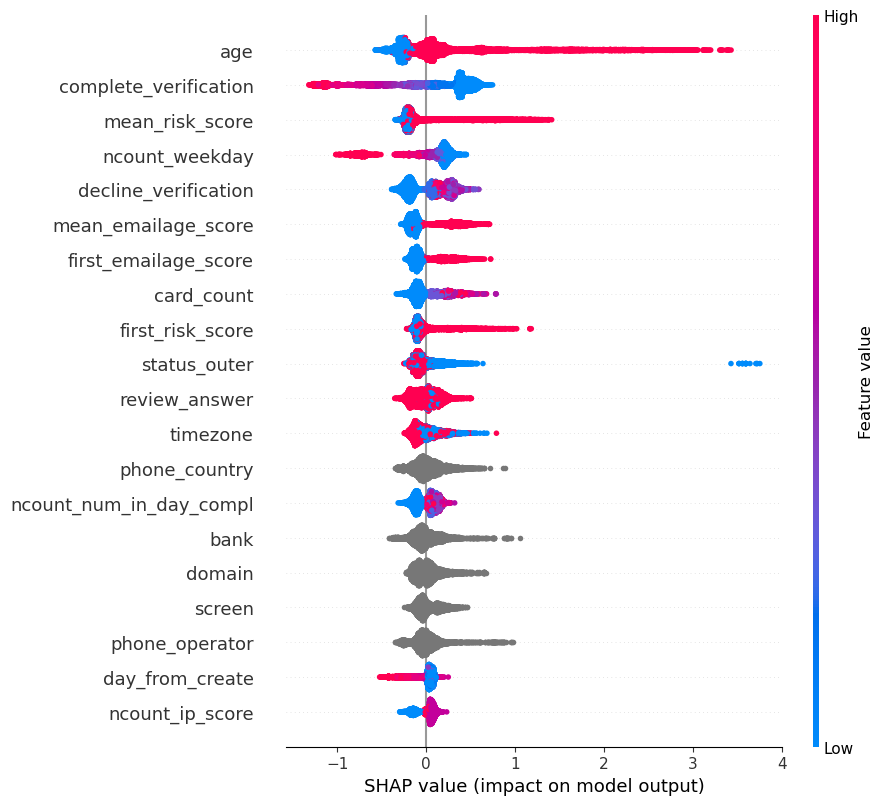

In [80]:
shap.summary_plot(shap_values, X_test)

# Curves for analysis

In [81]:
curve = get_roc_curve(model, test_dataset)
(fpr, tpr, thresholds) = curve
roc_auc = auc(fpr, tpr)

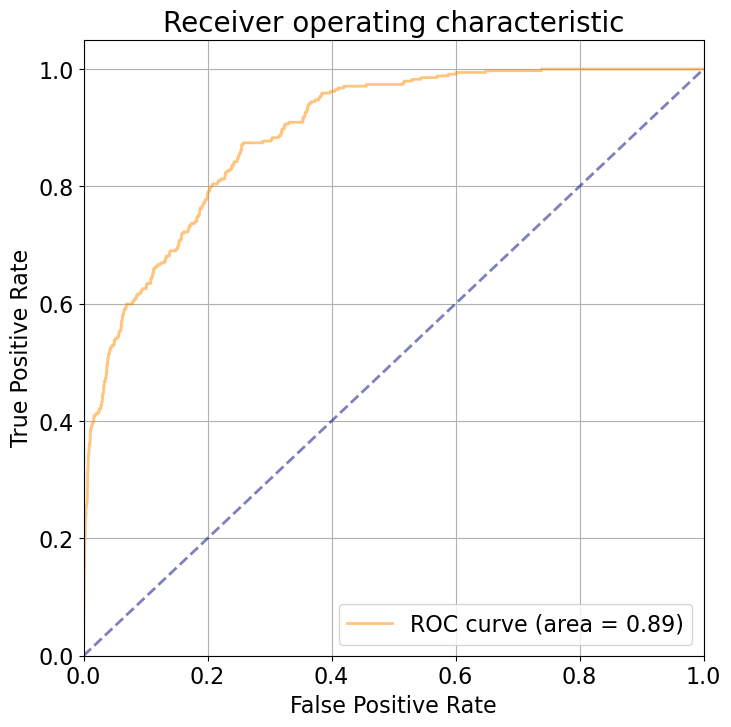

In [82]:
plt.figure(figsize=(8, 8))
lw = 2

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc, alpha=0.5)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('Receiver operating characteristic', fontsize=20)
plt.legend(loc="lower right", fontsize=16)
plt.show()

In [83]:
from catboost.utils import get_fpr_curve
from catboost.utils import get_fnr_curve

(thresholds, fpr) = get_fpr_curve(curve=curve)
(thresholds, fnr) = get_fnr_curve(curve=curve)

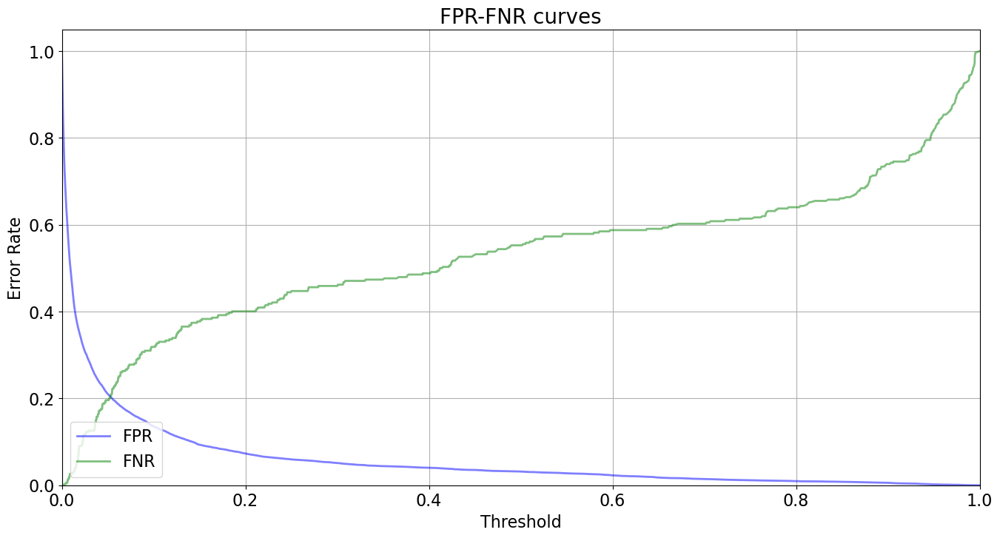

In [84]:
plt.figure(figsize=(16, 8))
lw = 2

plt.plot(thresholds, fpr, color='blue', lw=lw, label='FPR', alpha=0.5)
plt.plot(thresholds, fnr, color='green', lw=lw, label='FNR', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('Threshold', fontsize=16)
plt.ylabel('Error Rate', fontsize=16)
plt.title('FPR-FNR curves', fontsize=20)
plt.legend(loc="lower left", fontsize=16)
plt.show()

In [85]:
from catboost.utils import select_threshold

print(select_threshold(model=model, data=test_dataset))

0.05295101614222237


# Analysis of results

In [86]:
df_valid = X_valid.copy()
df_valid['fraud'] = y_valid
df_valid['amount'] = np.expm1(df_valid.amount)
df_valid['prob'] = model.predict_proba(eval_dataset)[:, 1]
lose = (df_valid[df_valid.fraud == 0].amount.sum() / 10
        - (df_valid[df_valid.fraud == 1].amount.sum()
        + df_valid[df_valid.fraud == 1].amount.count() * 100))
print(f'Profit for the period without anti-fraud system {lose}')

Profit for the period without anti-fraud system 97588.22854799381


In [87]:
thr = select_threshold(model=model, data=test_dataset)

In [88]:
df_valid['fraud_pred'] = df_valid.prob.mask(df_valid.prob < thr, 0)
df_valid['fraud_pred'] = df_valid.fraud_pred.mask(df_valid.fraud_pred > 0, 1)

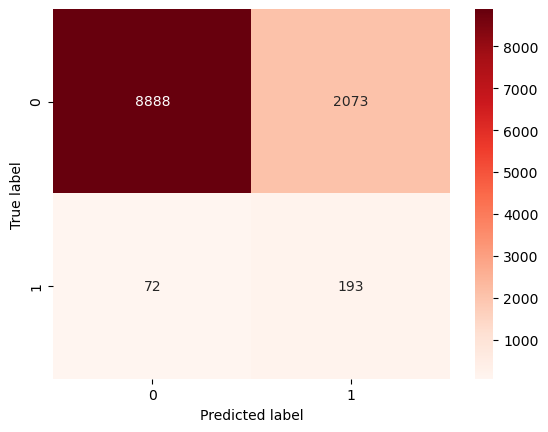

In [89]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(df_valid['fraud'],
                             df_valid['fraud_pred']),
            annot=True,
            fmt='d',
            cmap = 'Reds')
plt.xlabel('Predicted label') 
plt.ylabel('True label');

In [90]:
fr = df_valid.groupby(['fraud_pred', 'fraud'])['amount'].count()
f = df_valid.groupby(['fraud_pred', 'fraud'])['amount'].sum()

In [91]:
f.iloc[0] = f.iloc[0] / 10
f.iloc[1] += 100 * fr.iloc[1]
f.iloc[2] = f.iloc[2] / 10
f.iloc[3] += 100 * fr.iloc[1]
f

fraud_pred  fraud
0.0         0        179295.352448
            1         25626.437364
1.0         0         57882.126362
            1        101862.812898
Name: amount, dtype: float64

In [92]:
win = (f.iloc[0] - f.iloc[1] - f.iloc[2] + f.iloc[3])
print(f'Profit for the period with anti-fraud system {win} $')

Profit for the period with anti-fraud system 197649.60162001688 $


In [93]:
print(f'Simple implementation will give an increase in {win - lose} $')

Simple implementation will give an increase in 100061.37307202307 $


<AxesSubplot:>

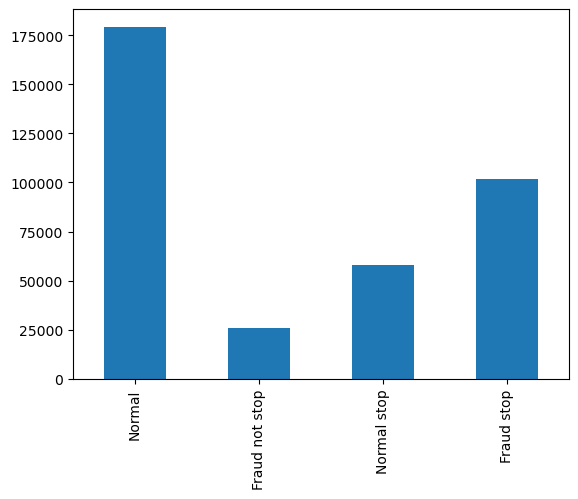

In [94]:
f.index = ['Normal',
           'Fraud not stop',
           'Normal stop',
           'Fraud stop']
f.plot(kind='bar')

# Saving final model

In [95]:
model.save_model('model', pool=train_dataset)